In [1]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
from matplotlib import mlab
import scipy.signal as signal
import xarray as xr
from scipy import stats
import pandas as pd
from scipy import linalg
import os

%matplotlib inline 
from matplotlib import pyplot as plt
import matplotlib.cm as cm 
from math import pi 
!pip install windrose openpyxl
from windrose import WindroseAxes

In [2]:
import pandas as pd
import numpy as np

# Define a function to load data for a specific year and month
def load_data(year, month):
    try:
        return pd.read_csv(f'{year}/{year}-{str(month).zfill(2)}.csv')
    except (FileNotFoundError, pd.errors.EmptyDataError):
        return None

# Define a function to load data for a specific range of months for a given year
def load_year_data(year, start_month=1, end_month=12):
    data = []
    for month in range(start_month, end_month + 1):
        df = load_data(year, month)
        if df is not None and not df.empty:
            data.append(df)
    if data:
        return pd.concat(data)
    return None

import pandas as pd
import numpy as np

# Define a function to load data for a specific year and month
def load_data(year, month):
    try:
        return pd.read_csv(f'{year}/{year}-{str(month).zfill(2)}.csv')
    except (FileNotFoundError, pd.errors.EmptyDataError):
        return None

# Define a function to load data for a specific range of months for a given year
def load_year_data(year, start_month=1, end_month=12):
    data = []
    for month in range(start_month, end_month + 1):
        df = load_data(year, month)
        if df is not None and not df.empty:
            data.append(df)
    if data:
        return pd.concat(data)
    return None

# Define a function to calculate wind components
def wind_uv_from_spddir(wspd, wdir):
    '''Convert wind speed and direction to eastward and northward components.
    
    Inputs:
    wspd - wind speed
    wdir - wind direction (wind is blowing FROM this direction, 
                           clockwise from true north)
    
    Outputs:
    u - eastward velocity component (TOWARDS the east)
    v - northward velocity component (TOWARDS the north)
    '''
    theta = np.array(wdir)  # direction CW from true north
    theta = np.deg2rad(theta)  # convert to radians
    x = -np.sin(-theta)
    y = np.cos(-theta)
    theta_cart = np.arctan2(y, x)  # direction CCW from east (Cartesian)
    u = -wspd * np.cos(theta_cart)  # eastward component
    v = -wspd * np.sin(theta_cart)  # northward component
    
    return u, v

# Load data for each year from 2010 to 2021 and process it
merged_files = {}
for year in range(2010, 2022):
    df = load_year_data(year)
    if df is not None:
        df['time'] = pd.to_datetime(df['pst_time'])  # Convert 'pst_time' to datetime
        merged_files[f'merged_files_{year}'] = df

# Initialize empty lists to store the arrays
time_list = []
wind_spd_list = []
wind_dir_list = []

# Extract arrays for time, wind speed, and wind direction
for key, df in merged_files.items():
    if 'time' in df.columns and 'wspd' in df.columns and 'wdir' in df.columns:
        time_list.append(df['time'])
        wind_spd_list.append(df['wspd'])
        wind_dir_list.append(df['wdir'])

# Unpack the lists into individual variables
time10, time11, time12, time13, time14, time15, time16, time17, time18, time19, time21 = time_list
wind_spd10, wind_spd11, wind_spd12, wind_spd13, wind_spd14, wind_spd15, wind_spd16, wind_spd17, wind_spd18, wind_spd19, wind_spd21 = wind_spd_list
wind_dir10, wind_dir11, wind_dir12, wind_dir13, wind_dir14, wind_dir15, wind_dir16, wind_dir17, wind_dir18, wind_dir19, wind_dir21 = wind_dir_list

# Load data for each year from 2010 to 2021 and process it
merged_files = {}
for year in range(2010, 2022):
    df = load_year_data(year)
    if df is not None:
        df['time'] = pd.to_datetime(df['pst_time'])  # Convert 'pst_time' to datetime
        merged_files[f'merged_files_{year}'] = df

# Initialize empty lists to store the arrays
time_list = []
wind_spd_list = []
wind_dir_list = []

# Extract arrays for time, wind speed, and wind direction
for key, df in merged_files.items():
    if 'time' in df.columns and 'wspd' in df.columns and 'wdir' in df.columns:
        time_list.append(df['time'])
        wind_spd_list.append(df['wspd'])
        wind_dir_list.append(df['wdir'])

# Unpack the lists into individual variables
time10, time11, time12, time13, time14, time15, time16, time17, time18, time19, time21 = time_list
wind_spd10, wind_spd11, wind_spd12, wind_spd13, wind_spd14, wind_spd15, wind_spd16, wind_spd17, wind_spd18, wind_spd19, wind_spd21 = wind_spd_list
wind_dir10, wind_dir11, wind_dir12, wind_dir13, wind_dir14, wind_dir15, wind_dir16, wind_dir17, wind_dir18, wind_dir19, wind_dir21 = wind_dir_list


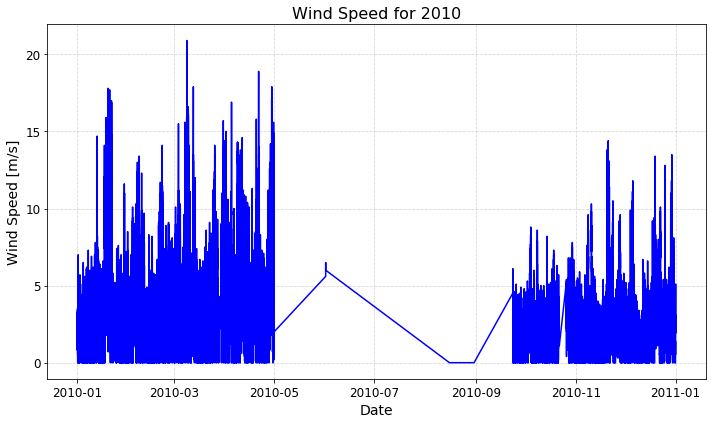

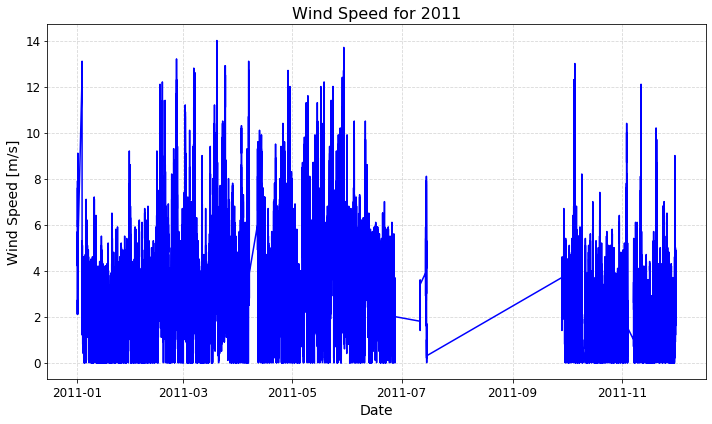

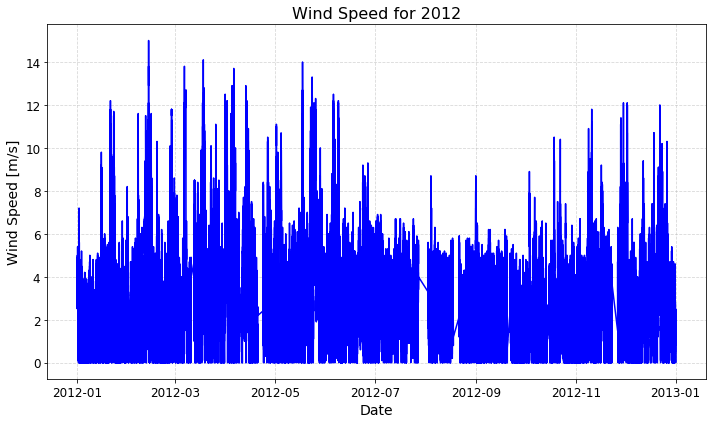

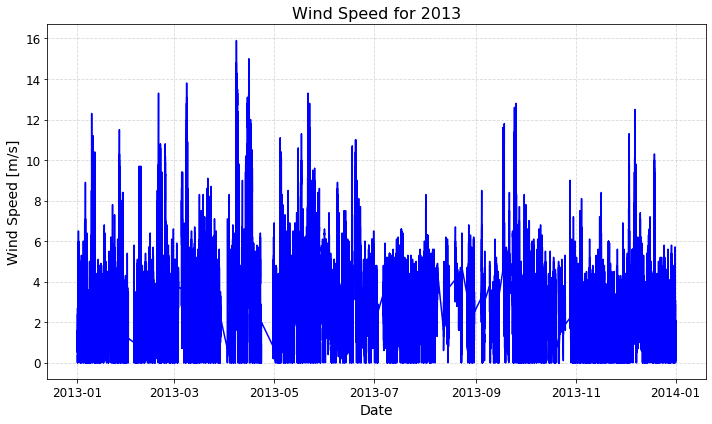

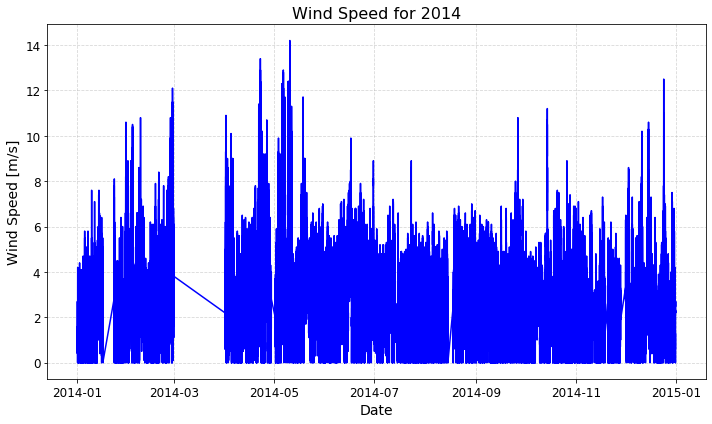

...

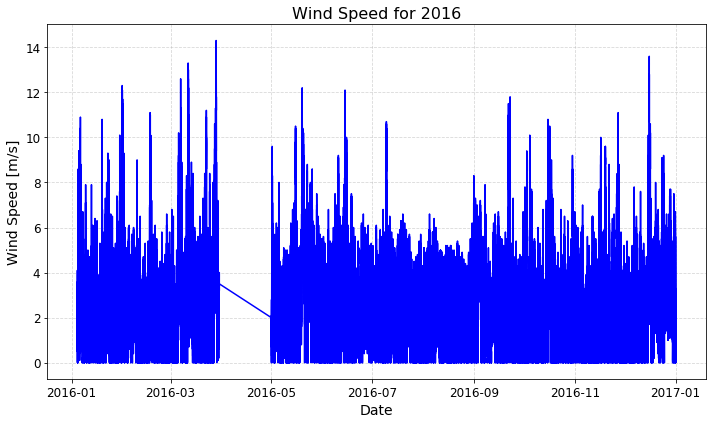

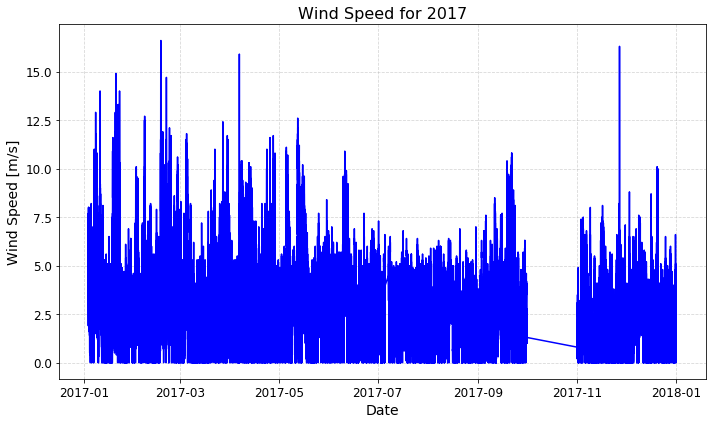

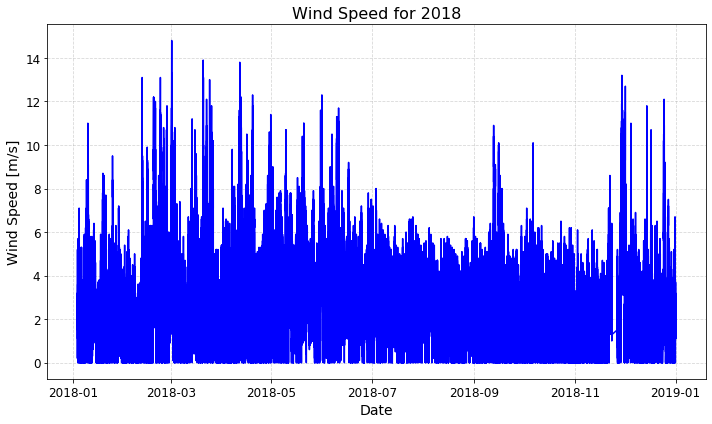

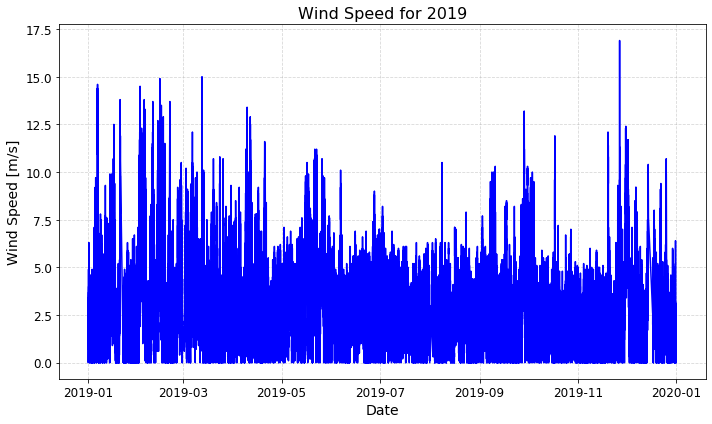

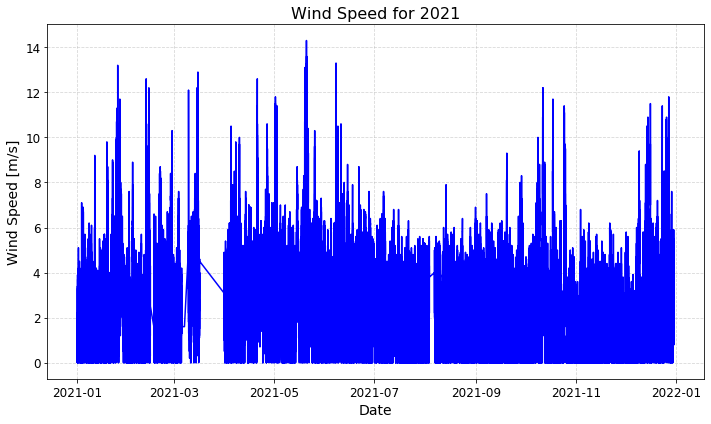

In [3]:
# Plot wind speed for each year
for time, wind_spd in zip(time_list, wind_spd_list):
    year_from_data = time.iloc[0].year  # Extract year from the time data
    plt.figure(figsize=(10, 6))
    plt.plot(time, wind_spd, color='blue', linestyle='-', linewidth=1.5)
    plt.title(f'Wind Speed for {year_from_data}', fontsize=16)
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Wind Speed [m/s]', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


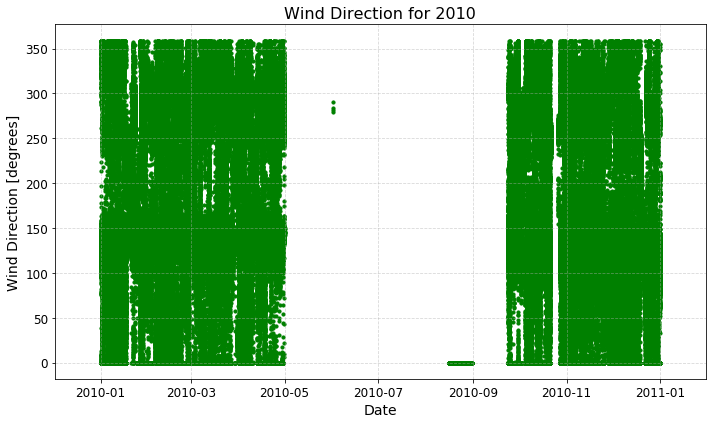

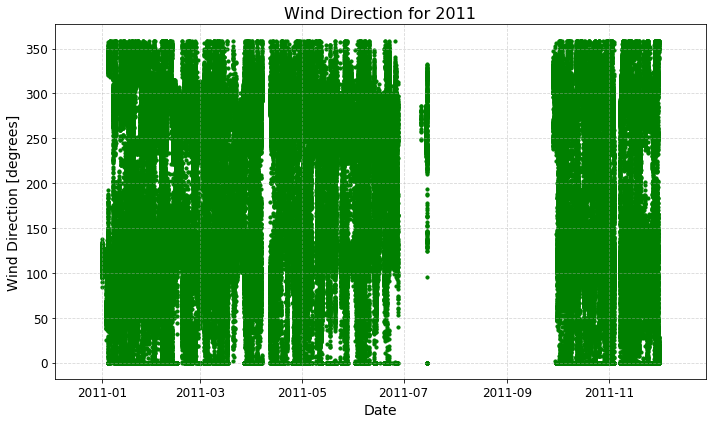

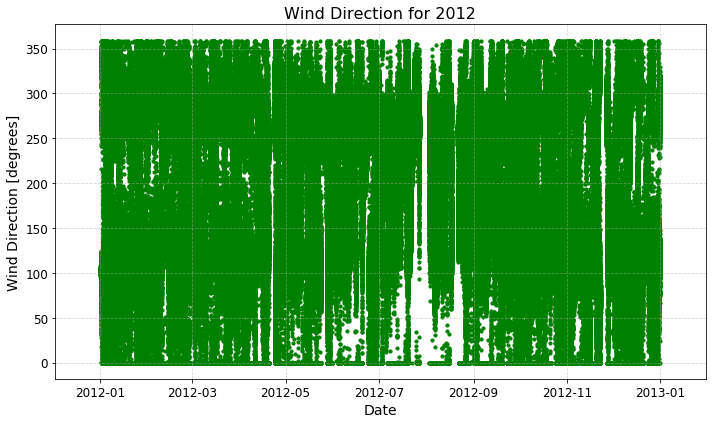

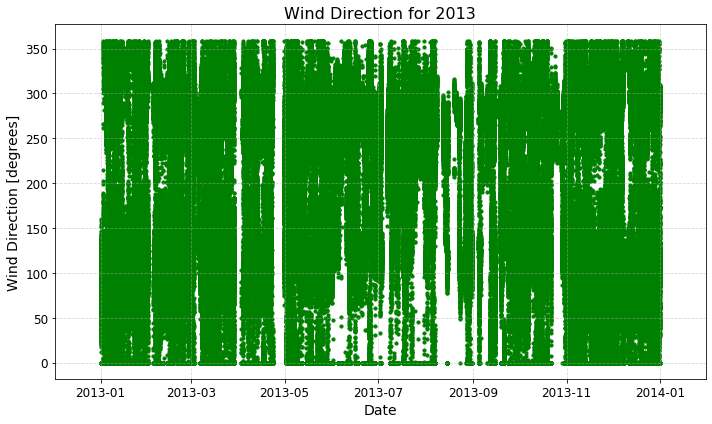

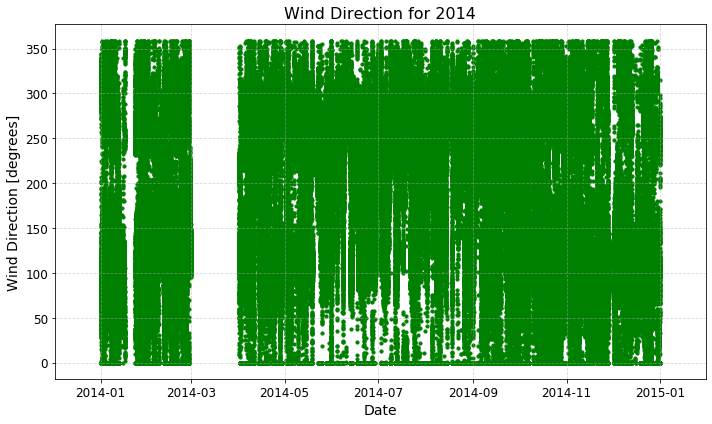

...

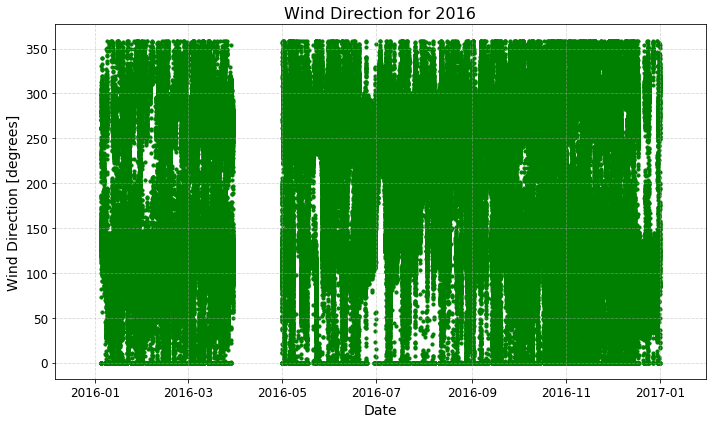

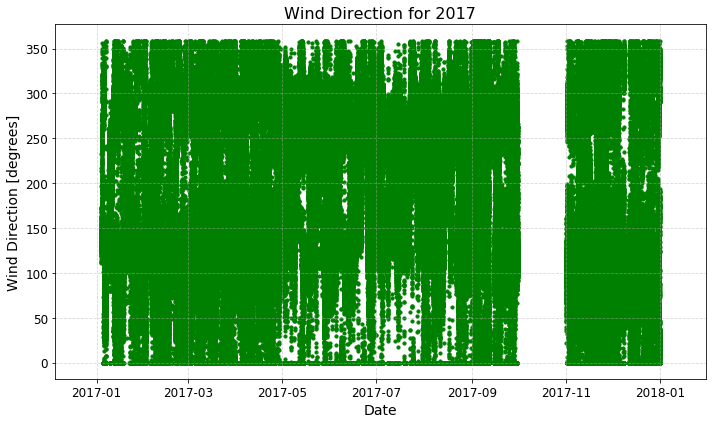

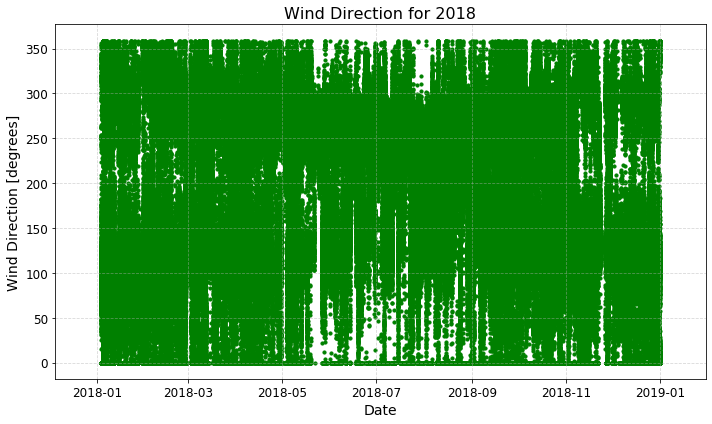

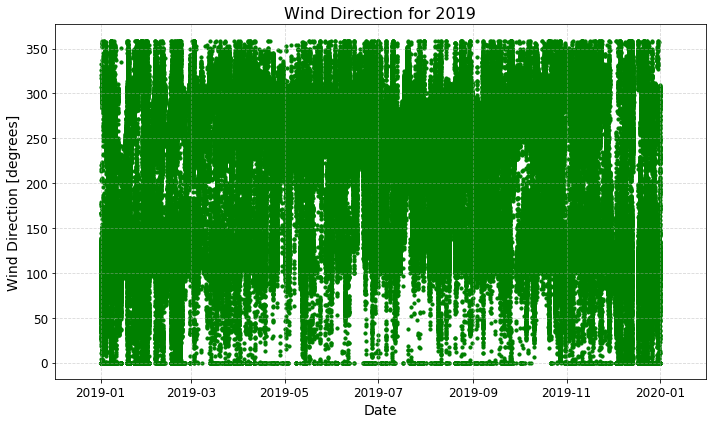

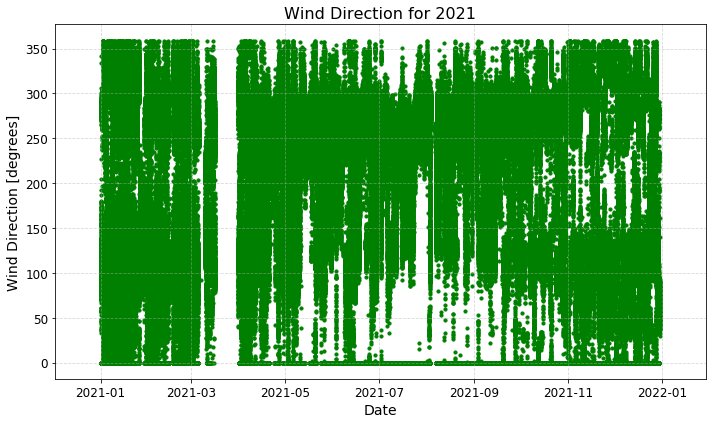

In [4]:
# Plot wind direction as dots for each year
for time, wind_dir in zip(time_list, wind_dir_list):
    year_from_data = time.iloc[0].year  # Extract year from the time data
    plt.figure(figsize=(10, 6))
    plt.scatter(time, wind_dir, color='green', s=10)
    plt.title(f'Wind Direction for {year_from_data}', fontsize=16)
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Wind Direction [degrees]', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


/Users/marisolfigueroa/opt/miniconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


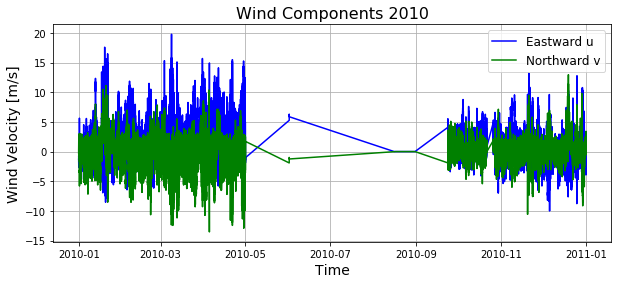

/Users/marisolfigueroa/opt/miniconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


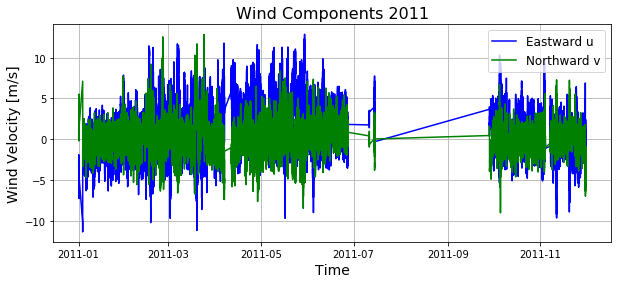

/Users/marisolfigueroa/opt/miniconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


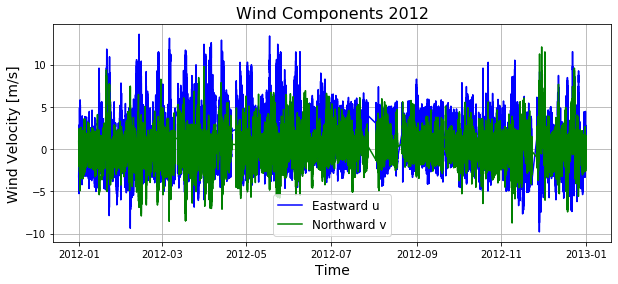

/Users/marisolfigueroa/opt/miniconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


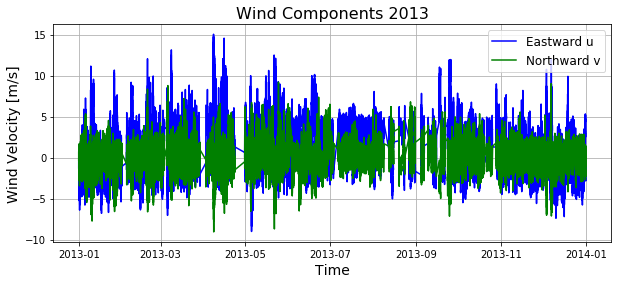

/Users/marisolfigueroa/opt/miniconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


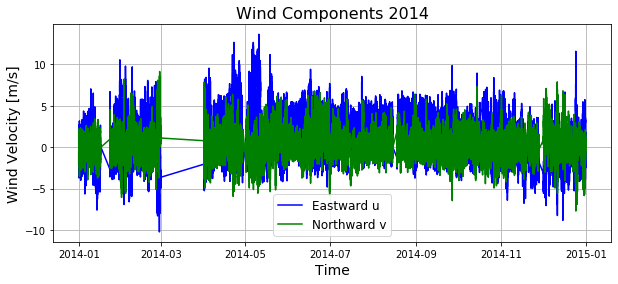

/Users/marisolfigueroa/opt/miniconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


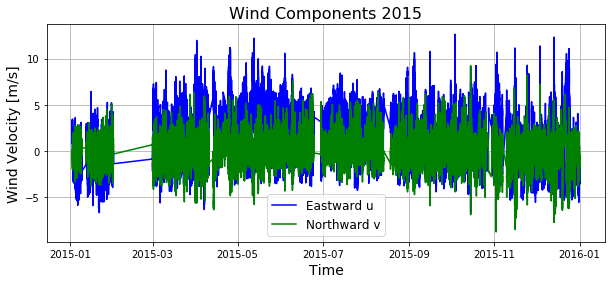

/Users/marisolfigueroa/opt/miniconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


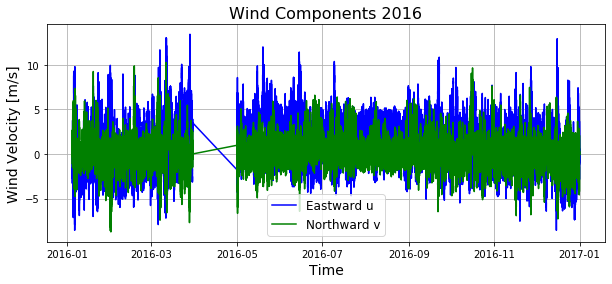

/Users/marisolfigueroa/opt/miniconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


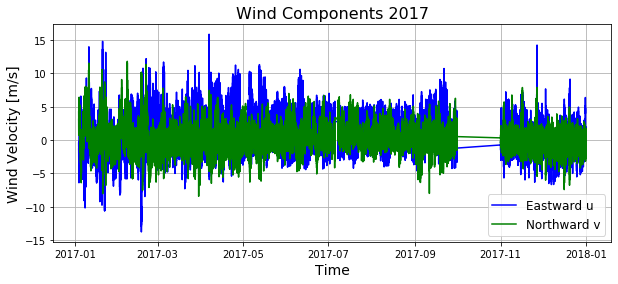

/Users/marisolfigueroa/opt/miniconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


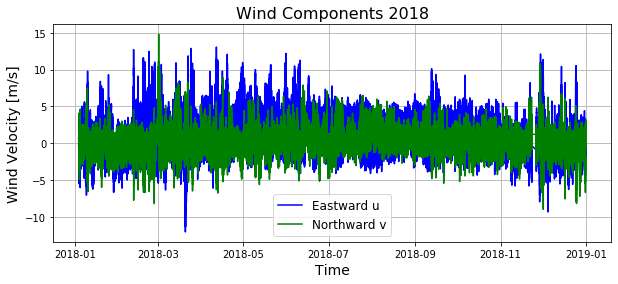

/Users/marisolfigueroa/opt/miniconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


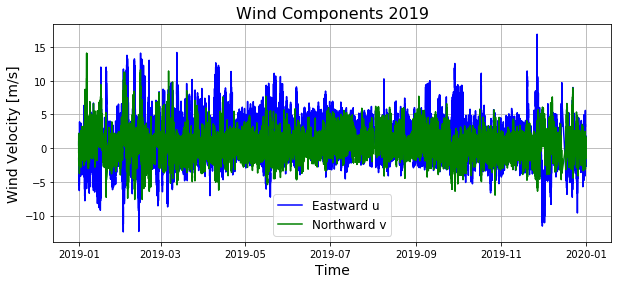

/Users/marisolfigueroa/opt/miniconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


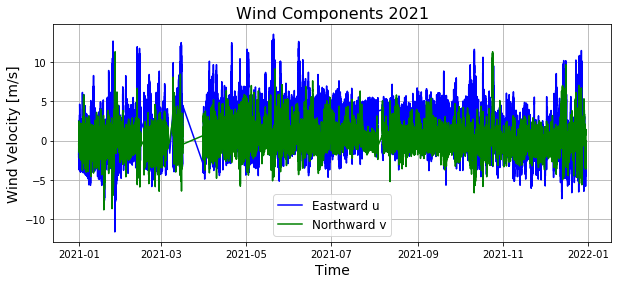

In [5]:
# Plot wind components for each year
for time, wind_spd, wind_dir in zip(time_list, wind_spd_list, wind_dir_list):
    year_from_data = time.iloc[0].year  # Extract year from the time data
    u, v = wind_uv_from_spddir(wind_spd, wind_dir)
    plt.figure(figsize=(10, 4))
    plt.plot(time, u, label='Eastward u', color='blue')
    plt.plot(time, v, label='Northward v', color='green')
    plt.ylabel('Wind Velocity [m/s]', fontsize=14)
    plt.xlabel('Time', fontsize=14)
    plt.legend(fontsize=12)
    plt.title(f'Wind Components {year_from_data}', fontsize=16)  # Include the correct year
    plt.grid(True)
    plt.show()


In [6]:
#WIND ROSES FOR ENTIRE YEAR

<Figure size 576x576 with 0 Axes>

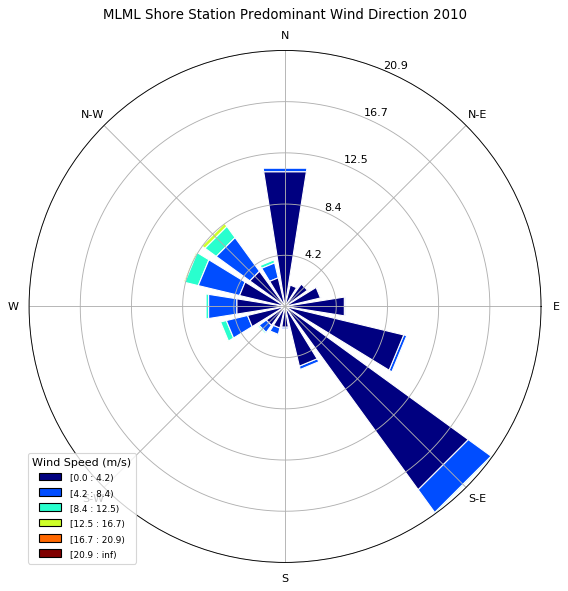

<Figure size 576x576 with 0 Axes>

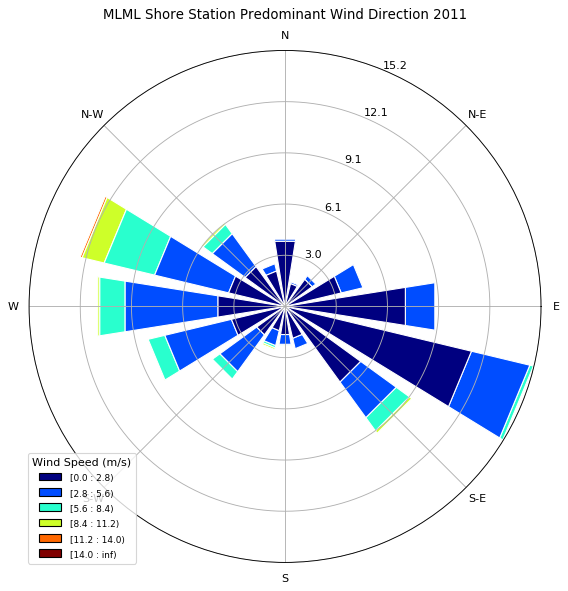

<Figure size 576x576 with 0 Axes>

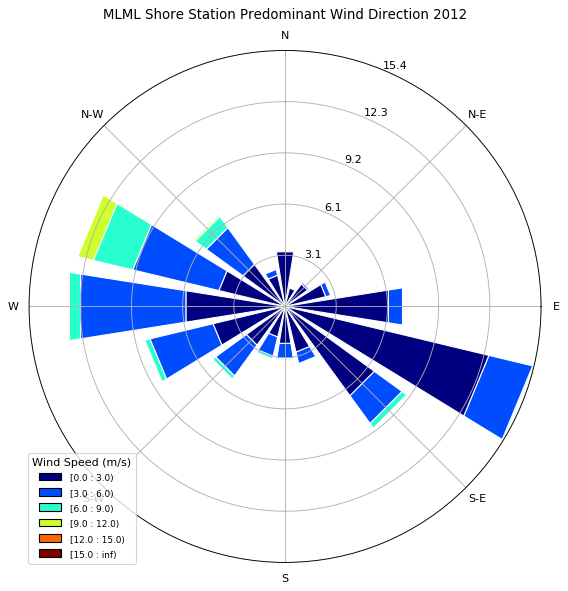

<Figure size 576x576 with 0 Axes>

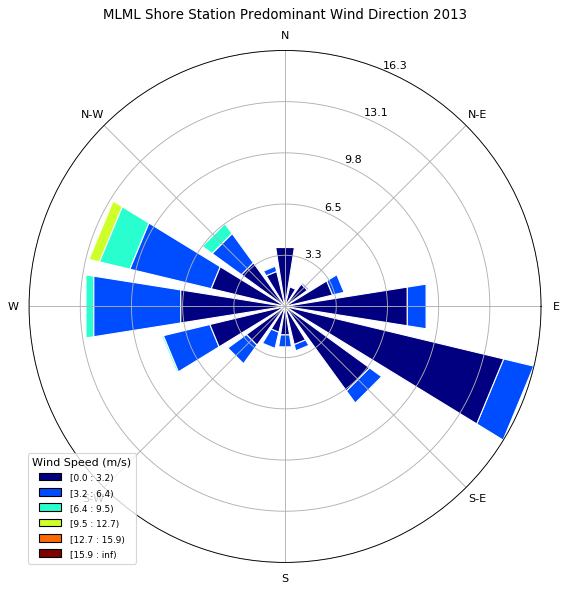

<Figure size 576x576 with 0 Axes>

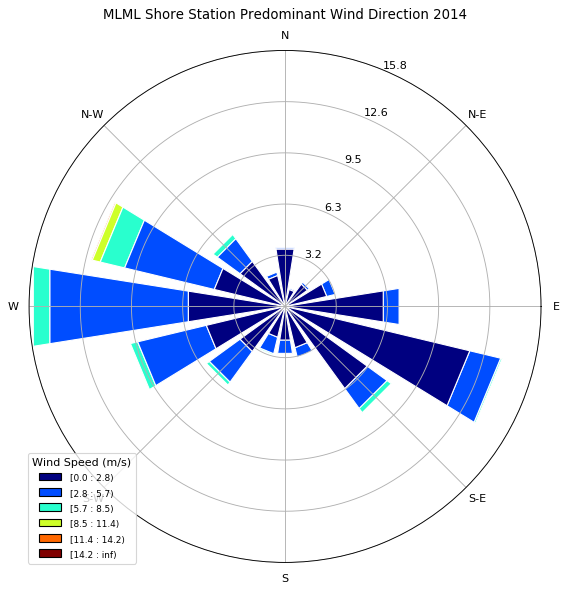

<Figure size 576x576 with 0 Axes>

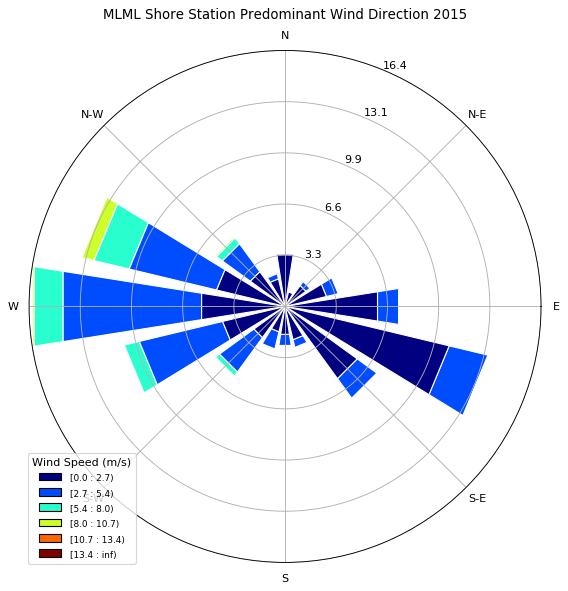

<Figure size 576x576 with 0 Axes>

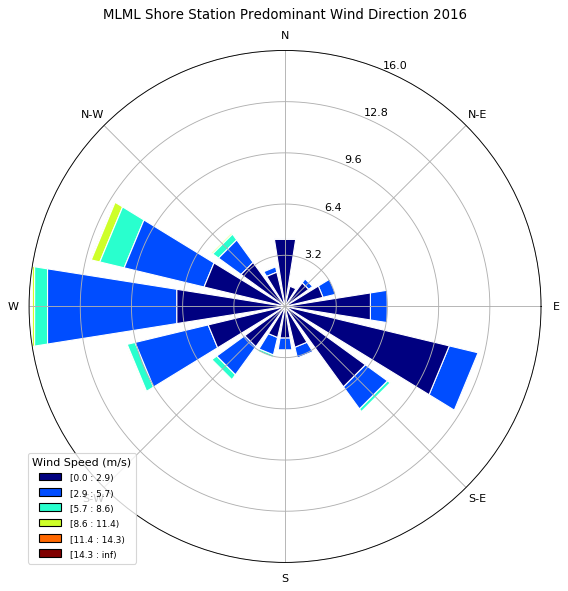

<Figure size 576x576 with 0 Axes>

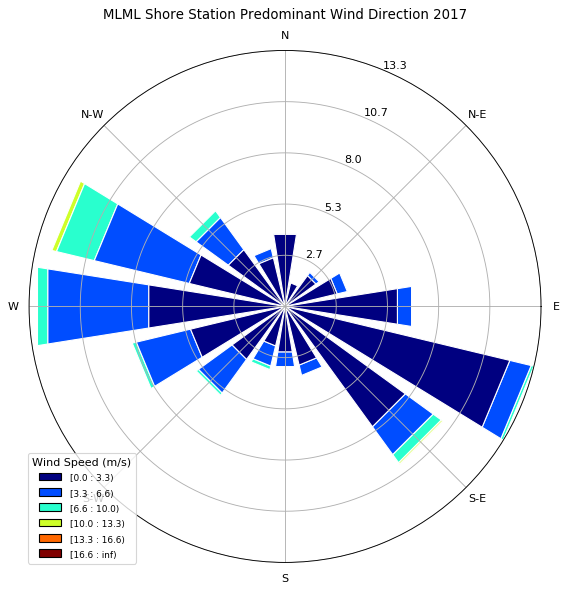

<Figure size 576x576 with 0 Axes>

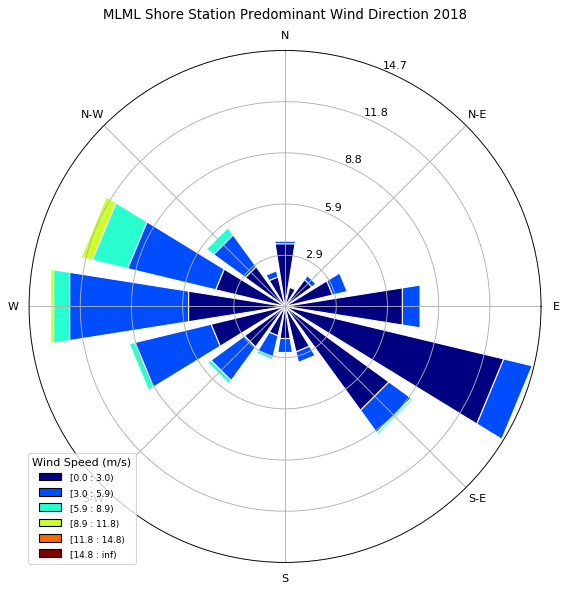

<Figure size 576x576 with 0 Axes>

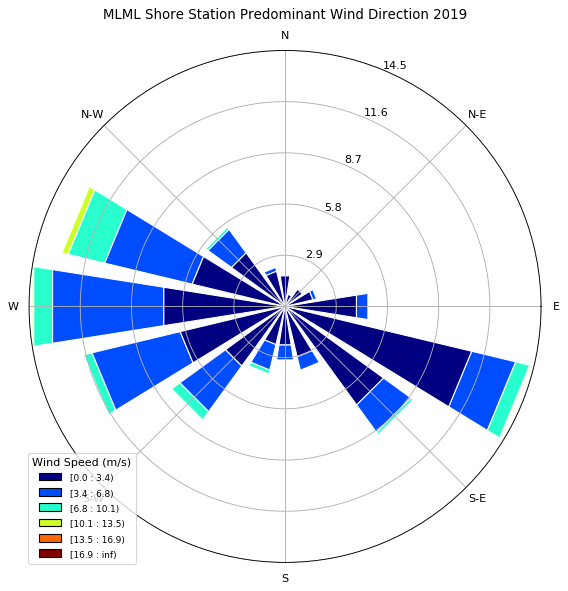

<Figure size 576x576 with 0 Axes>

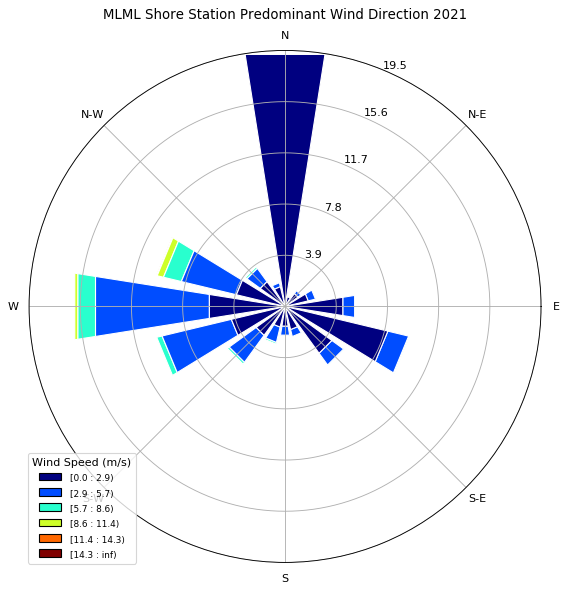

In [7]:
import pandas as pd
from windrose import WindroseAxes
import matplotlib.pyplot as plt

# Define a function to load data for a specific year and month
def load_data(year, month):
    try:
        return pd.read_csv(f'{year}/{year}-{str(month).zfill(2)}.csv')
    except (FileNotFoundError, pd.errors.EmptyDataError):
        return None

# Define a function to load data for a specific range of months for a given year
def load_year_data(year, start_month=1, end_month=12):
    data = []
    for month in range(start_month, end_month + 1):
        df = load_data(year, month)
        if df is not None and not df.empty:
            data.append(df)
    if data:
        return pd.concat(data)
    return None

# Load data for each year from 2010 to 2021 and process it
merged_files = {}
for year in range(2010, 2022):
    if year == 2020:
        continue  # Skip 2020
    df = load_year_data(year)
    if df is not None:
        df['time'] = pd.to_datetime(df['pst_time'])  # Convert 'pst_time' to datetime
        merged_files[year] = df

# Plot wind roses for each year
for year, df in merged_files.items():
    plt.figure(figsize=(8, 8))
    ax = WindroseAxes.from_ax()
    ax.bar(df['wdir'], df['wspd'], normed=True, opening=0.8, edgecolor='white')
    ax.set_legend(title="Wind Speed (m/s)")
    title = f'MLML Shore Station Predominant Wind Direction {year}'
    plt.title(title)
    plt.show()


<Figure size 576x576 with 0 Axes>

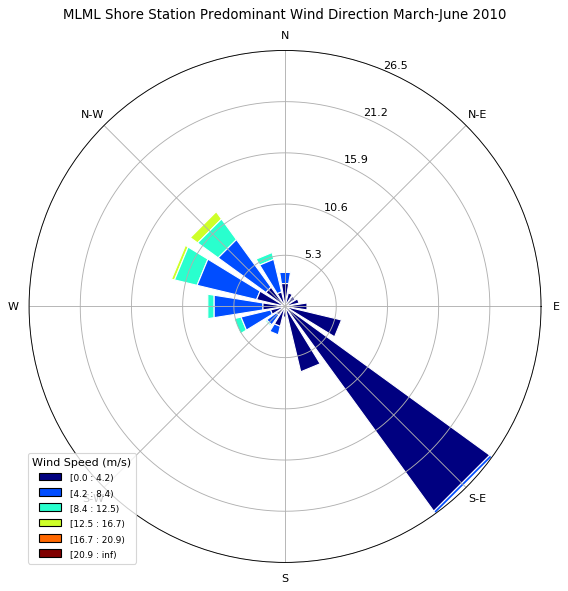

<Figure size 576x576 with 0 Axes>

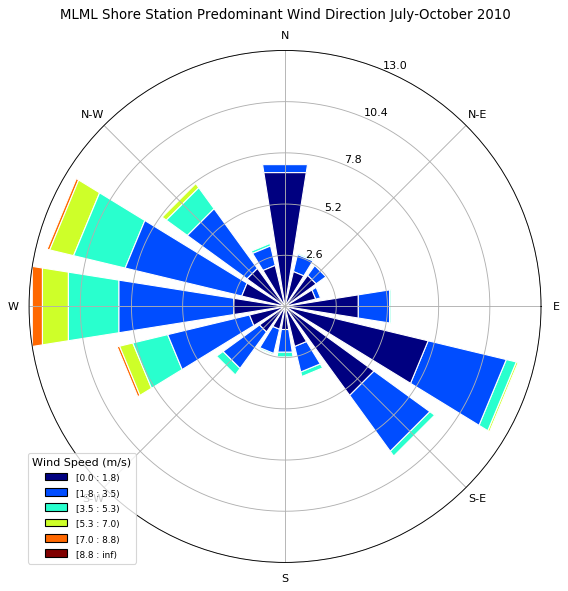

<Figure size 576x576 with 0 Axes>

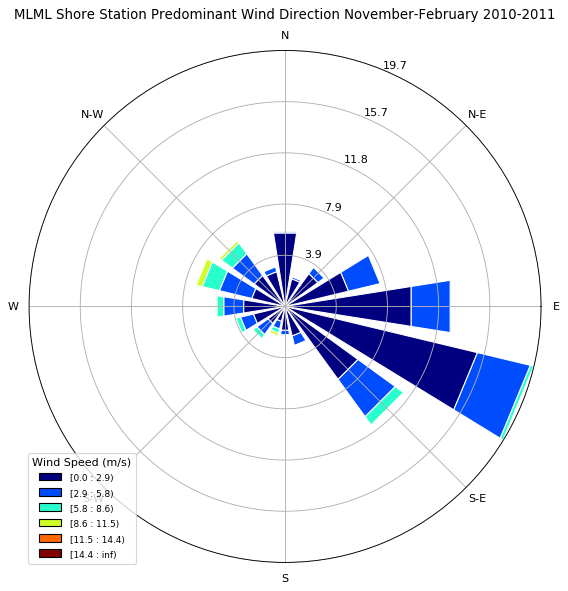

<Figure size 576x576 with 0 Axes>

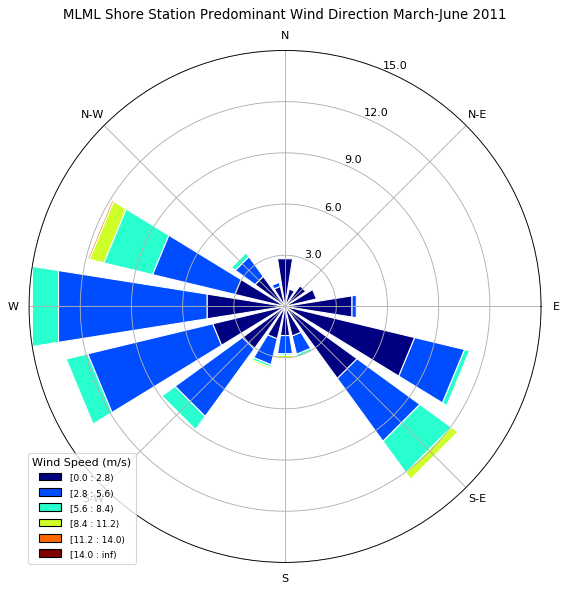

<Figure size 576x576 with 0 Axes>

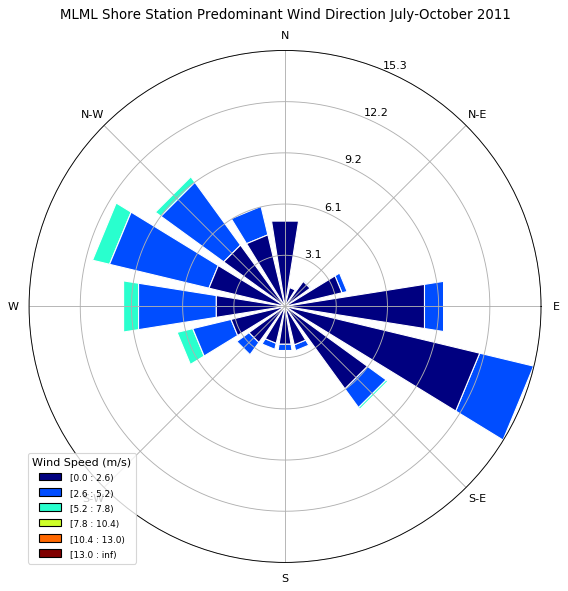

<Figure size 576x576 with 0 Axes>

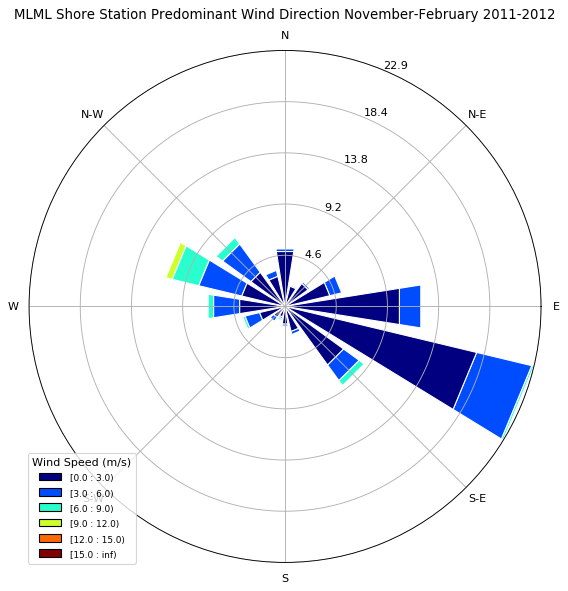

<Figure size 576x576 with 0 Axes>

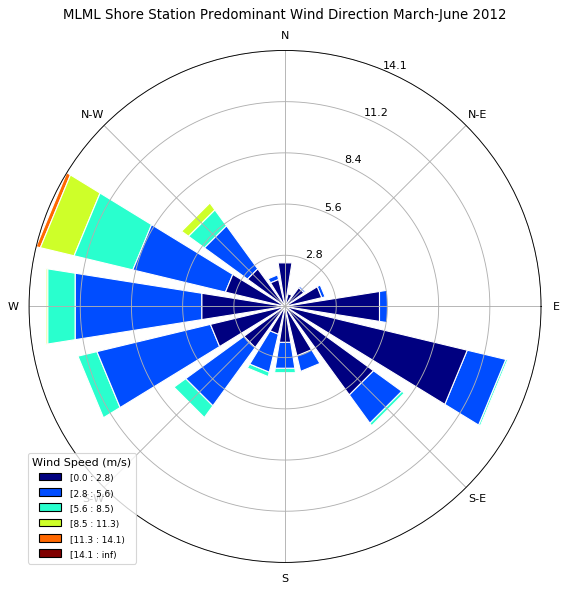

<Figure size 576x576 with 0 Axes>

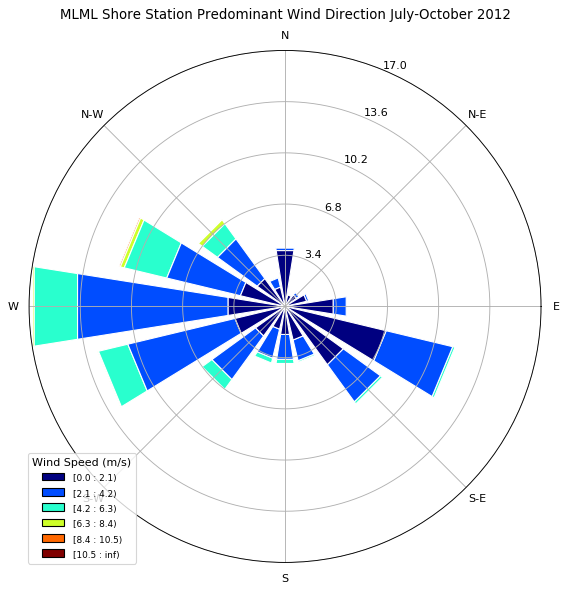

<Figure size 576x576 with 0 Axes>

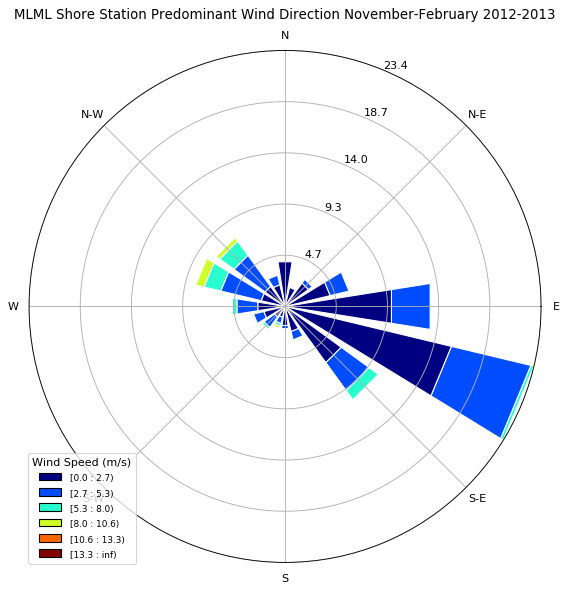

<Figure size 576x576 with 0 Axes>

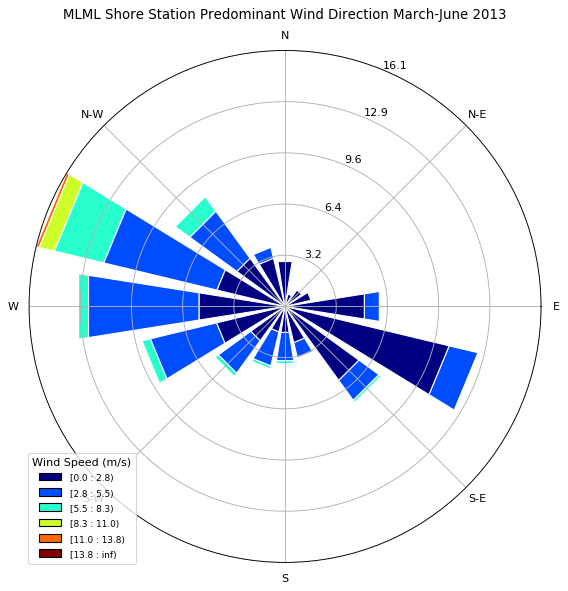

<Figure size 576x576 with 0 Axes>

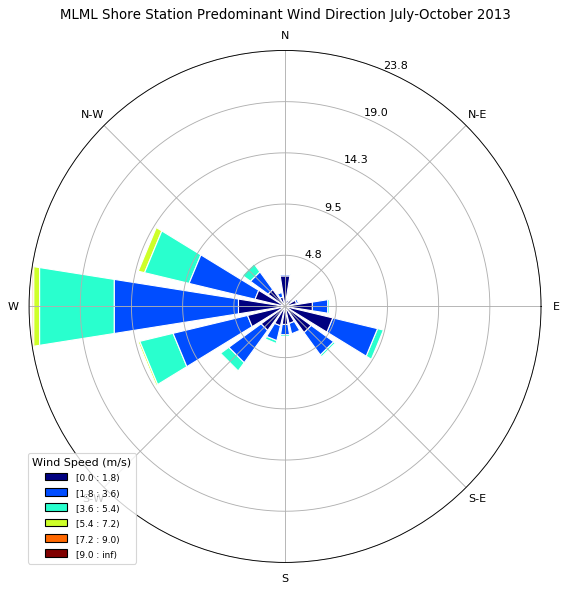

<Figure size 576x576 with 0 Axes>

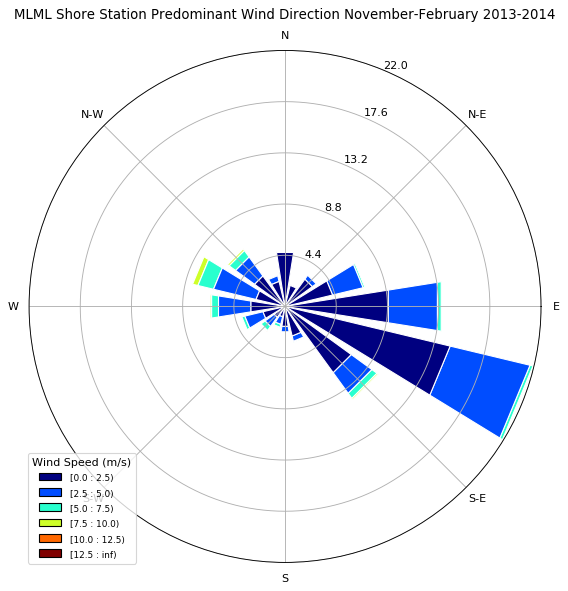

<Figure size 576x576 with 0 Axes>

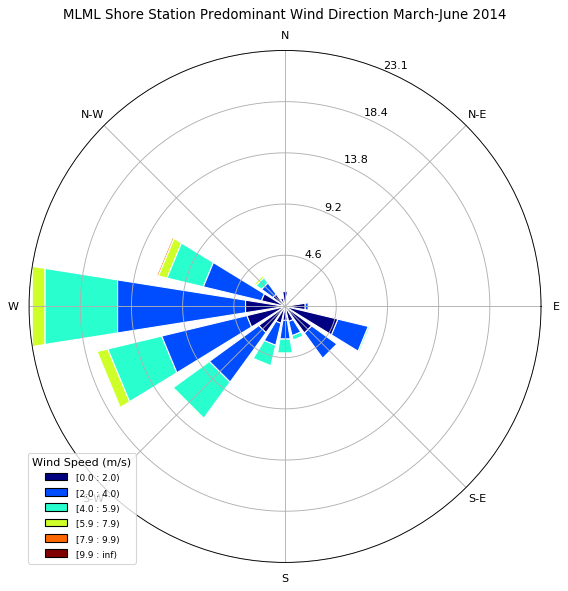

<Figure size 576x576 with 0 Axes>

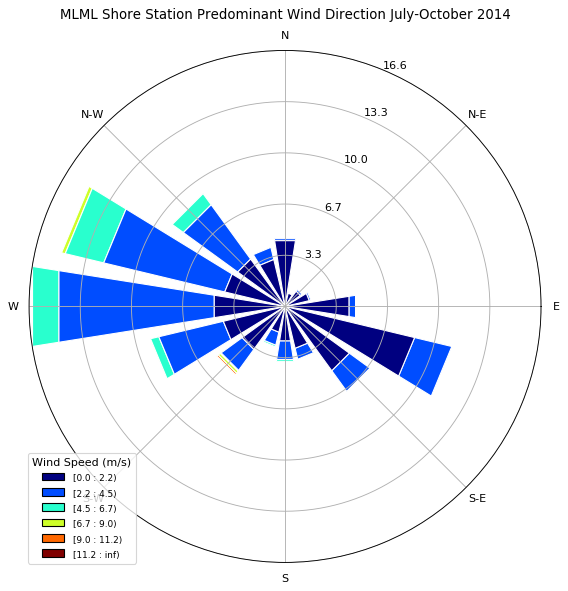

<Figure size 576x576 with 0 Axes>

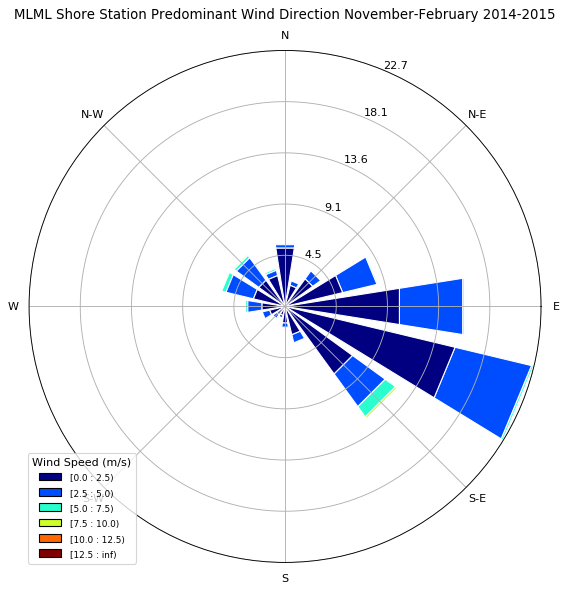

<Figure size 576x576 with 0 Axes>

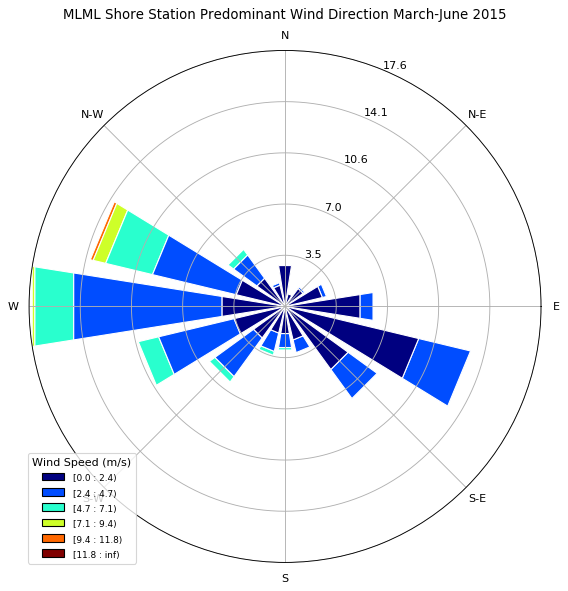

<Figure size 576x576 with 0 Axes>

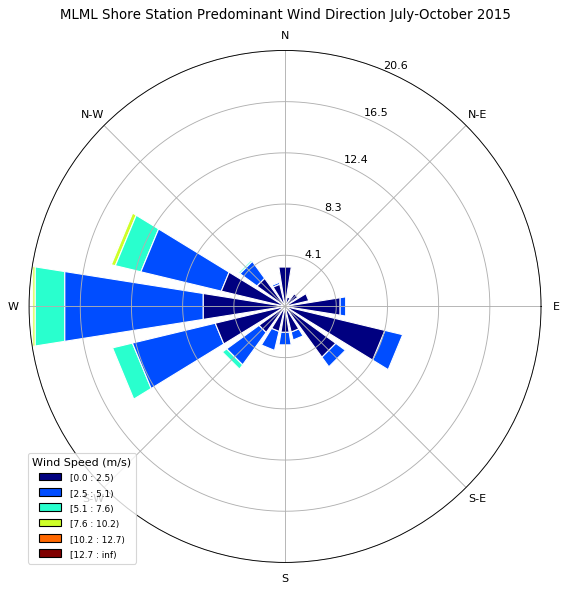

<Figure size 576x576 with 0 Axes>

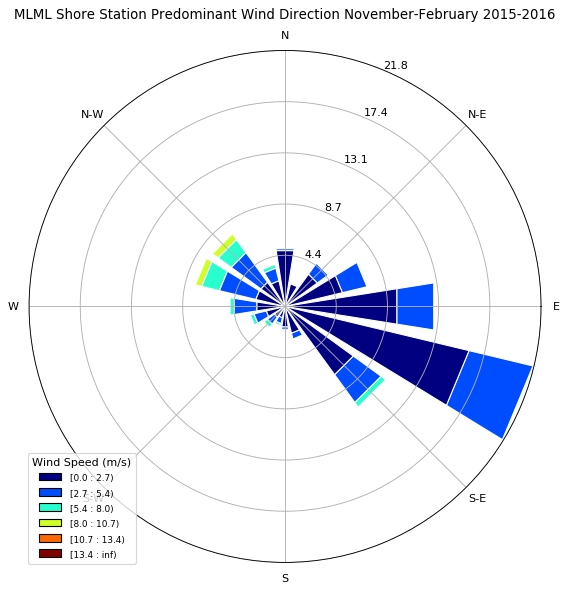

<Figure size 576x576 with 0 Axes>

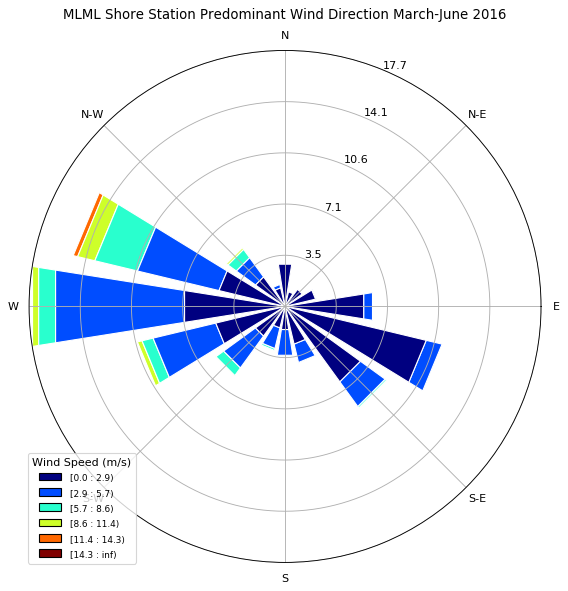

<Figure size 576x576 with 0 Axes>

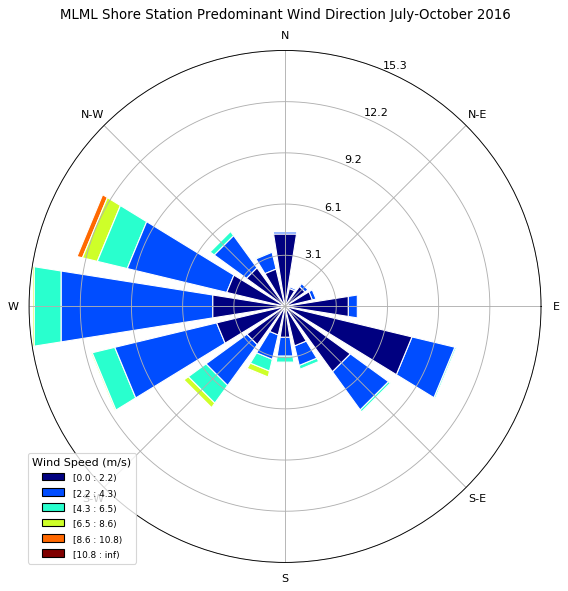

<Figure size 576x576 with 0 Axes>

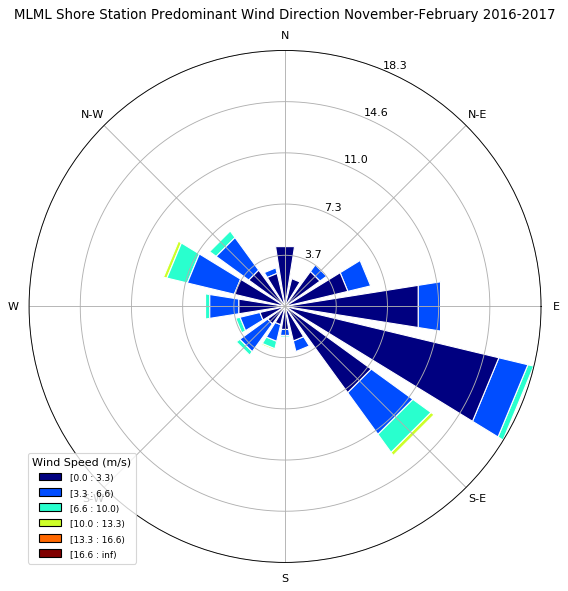

<Figure size 576x576 with 0 Axes>

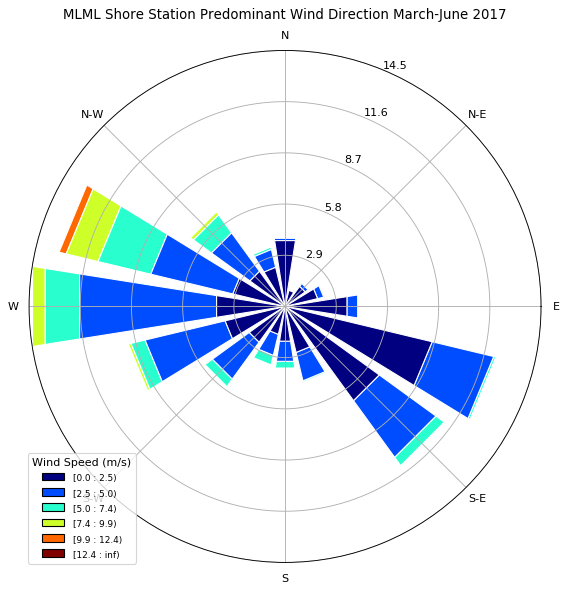

<Figure size 576x576 with 0 Axes>

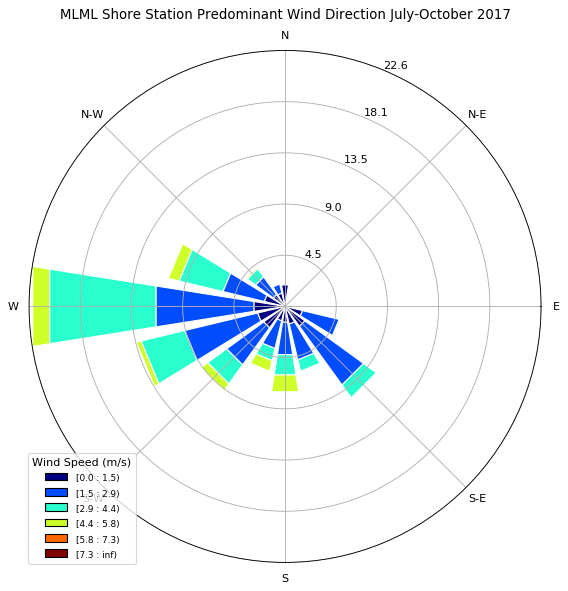

<Figure size 576x576 with 0 Axes>

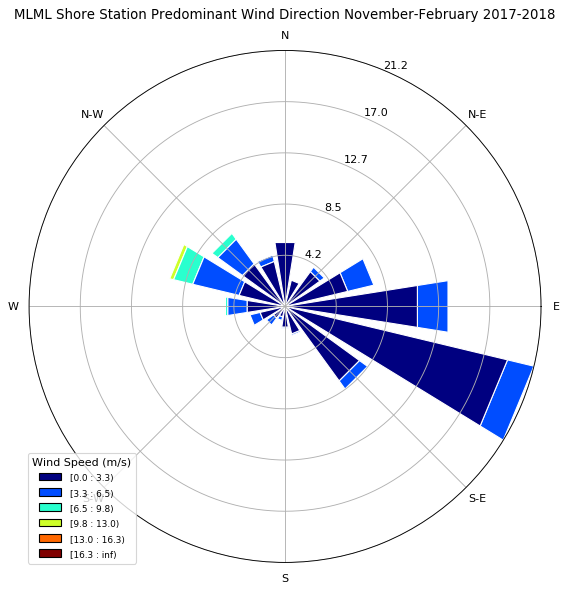

<Figure size 576x576 with 0 Axes>

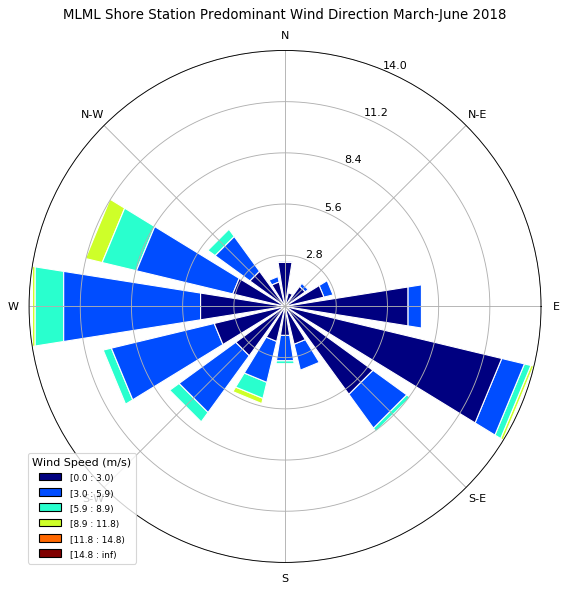

<Figure size 576x576 with 0 Axes>

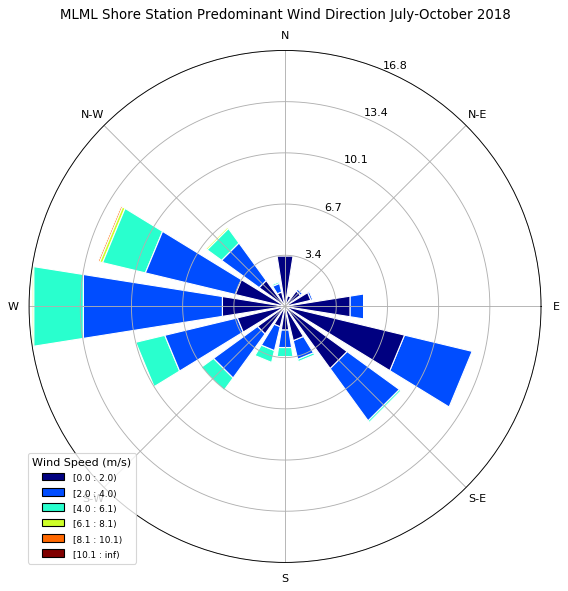

<Figure size 576x576 with 0 Axes>

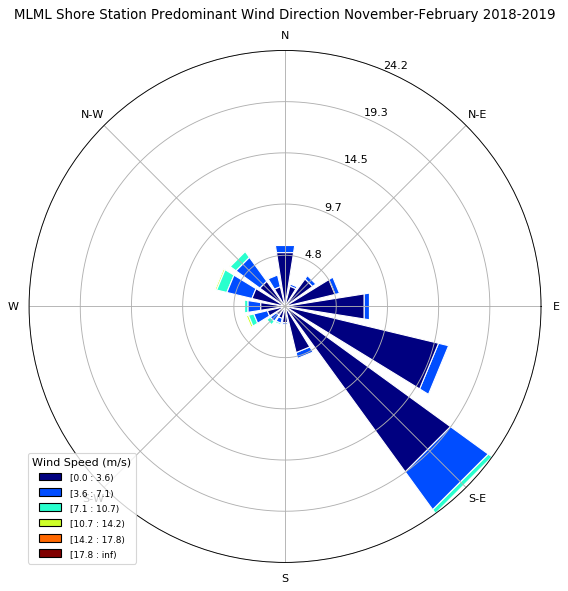

In [8]:
import pandas as pd
from windrose import WindroseAxes
import matplotlib.pyplot as plt

# Define a function to load data for a specific year and month
def load_data(year, month):
    try:
        return pd.read_csv(f'{year}/{year}-{str(month).zfill(2)}.csv')
    except (FileNotFoundError, pd.errors.EmptyDataError):
        return None

# Define a function to load data for a specific range of months for a given year
def load_year_data(year, start_month=1, end_month=12):
    data = []
    for month in range(start_month, end_month + 1):
        df = load_data(year, month)
        if df is not None and not df.empty:
            data.append(df)
    if data:
        return pd.concat(data)
    return None

# Define month ranges
month_ranges = [(3, 6), (7, 10), (11, 12, 1, 2)]

# Load data for each year from 2010 to 2018 and process it
merged_files = {}
for year in range(2010, 2019):  # 2019 is excluded
    if year == 2020:
        continue  # Skip 2020
    df = load_year_data(year)
    if df is not None:
        df['time'] = pd.to_datetime(df['pst_time'])  # Convert 'pst_time' to datetime
        merged_files[year] = df

# Plot wind roses for subsets March-June, July-October, and November-February for each year
for year, df in merged_files.items():
    if year == 2020:
        continue  # Skip 2020
    for i, month_range in enumerate(month_ranges):
        if month_range == (11, 12, 1, 2):
            next_year = year + 1 if year < 2018 else 2010  # Wrap around to 2010 for February
            subset = pd.concat([merged_files[year][merged_files[year]['time'].dt.month.isin([11, 12])],
                                merged_files[next_year][merged_files[next_year]['time'].dt.month.isin([1, 2])]])
        else:
            subset = df[df['time'].dt.month.isin(month_range)]
        
        plt.figure(figsize=(8, 8))
        ax = WindroseAxes.from_ax()
        ax.bar(subset['wdir'], subset['wspd'], normed=True, opening=0.8, edgecolor='white')
        ax.set_legend(title="Wind Speed (m/s)")
        month_names = ['March-June', 'July-October', 'November-February']
        if month_range == (11, 12, 1, 2):
            title = f'MLML Shore Station Predominant Wind Direction {month_names[i]} {year}-{year + 1}'
        else:
            title = f'MLML Shore Station Predominant Wind Direction {month_names[i]} {year}'
        plt.title(title)
        plt.show()


<Figure size 576x576 with 0 Axes>

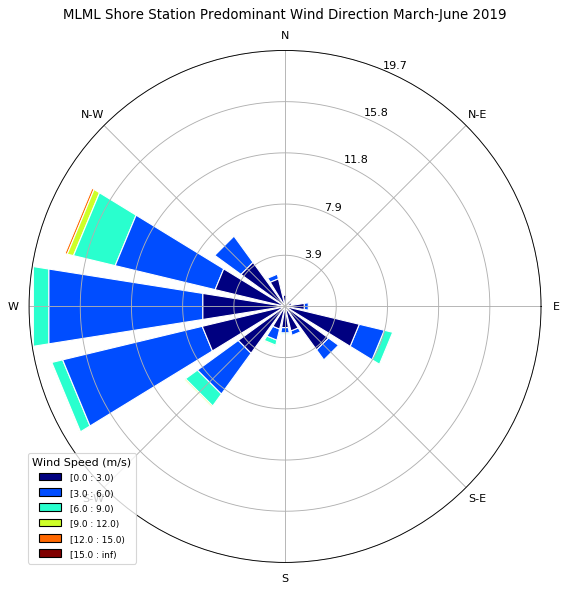

<Figure size 576x576 with 0 Axes>

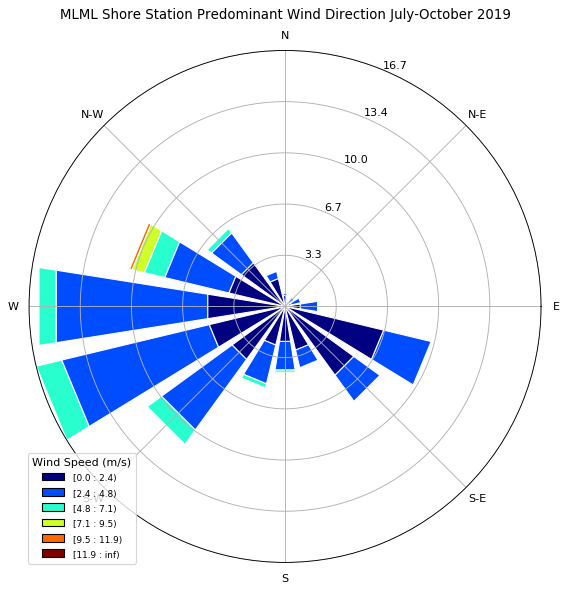

<Figure size 576x576 with 0 Axes>

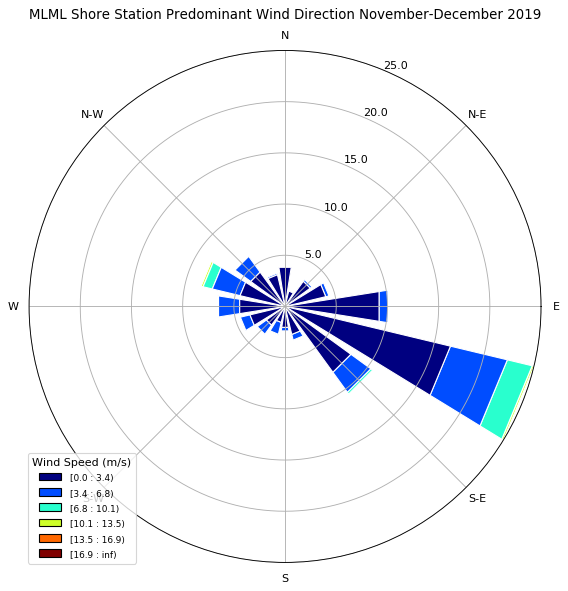

In [9]:
import pandas as pd
from windrose import WindroseAxes
import matplotlib.pyplot as plt

# Define a function to load data for a specific year and month
def load_data(year, month):
    try:
        return pd.read_csv(f'{year}/{year}-{str(month).zfill(2)}.csv')
    except (FileNotFoundError, pd.errors.EmptyDataError):
        return None

# Define a function to load data for a specific range of months for a given year
def load_year_data(year, start_month=1, end_month=12):
    data = []
    for month in range(start_month, end_month + 1):
        df = load_data(year, month)
        if df is not None and not df.empty:
            data.append(df)
    if data:
        return pd.concat(data)
    return None

# Load data for each year from 2010 to 2021 and process it
merged_files = {}
for year in range(2010, 2022):
    df = load_year_data(year)
    if df is not None:
        df['time'] = pd.to_datetime(df['pst_time'])  # Convert 'pst_time' to datetime
        merged_files[year] = df

# Plot wind roses for subset of 2019 with month ranges March-June, July-October, and November-December
df_2019 = merged_files[2019]
month_ranges = [(3, 6), (7, 10), (11, 12)]

for i, month_range in enumerate(month_ranges):
    subset = df_2019[df_2019['time'].dt.month.isin(month_range)]
    if subset.empty:
        continue  # Skip empty subsets
    plt.figure(figsize=(8, 8))
    ax = WindroseAxes.from_ax()
    ax.bar(subset['wdir'], subset['wspd'], normed=True, opening=0.8, edgecolor='white')
    ax.set_legend(title="Wind Speed (m/s)")
    month_names = ['March-June', 'July-October', 'November-December']
    title = f'MLML Shore Station Predominant Wind Direction {month_names[i]} 2019'
    plt.title(title)
    plt.show()


<Figure size 576x576 with 0 Axes>

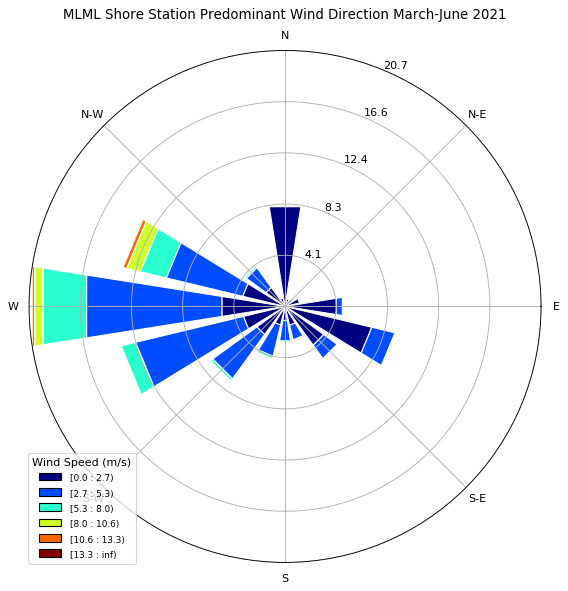

<Figure size 576x576 with 0 Axes>

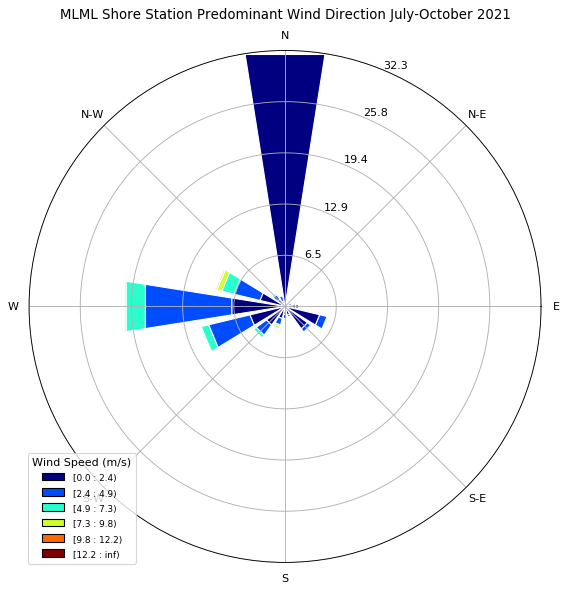

<Figure size 576x576 with 0 Axes>

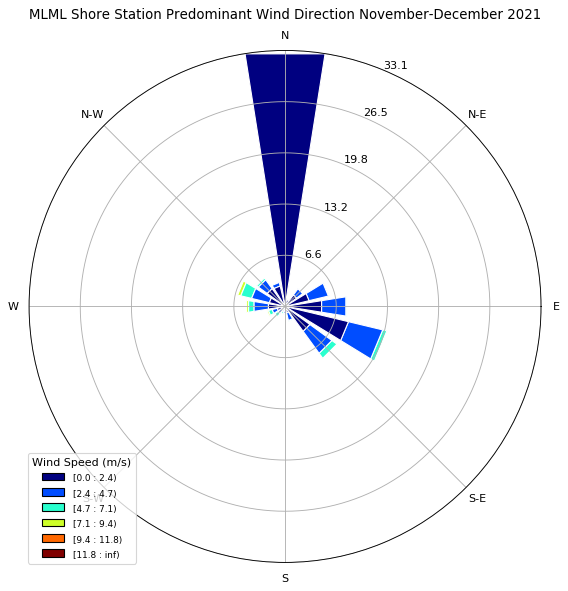

In [10]:
# Plot wind roses for subset of 2021 with month ranges March-June, July-October, and November-December
df_2021 = merged_files[2021]

for i, month_range in enumerate(month_ranges):
    subset = df_2021[df_2021['time'].dt.month.isin(month_range)]
    if subset.empty:
        continue  # Skip empty subsets
    plt.figure(figsize=(8, 8))
    ax = WindroseAxes.from_ax()
    ax.bar(subset['wdir'], subset['wspd'], normed=True, opening=0.8, edgecolor='white')
    ax.set_legend(title="Wind Speed (m/s)")
    month_names = ['March-June', 'July-October', 'November-December']
    title = f'MLML Shore Station Predominant Wind Direction {month_names[i]} 2021'
    plt.title(title)
    plt.show()


In [11]:
#Spectral analyses

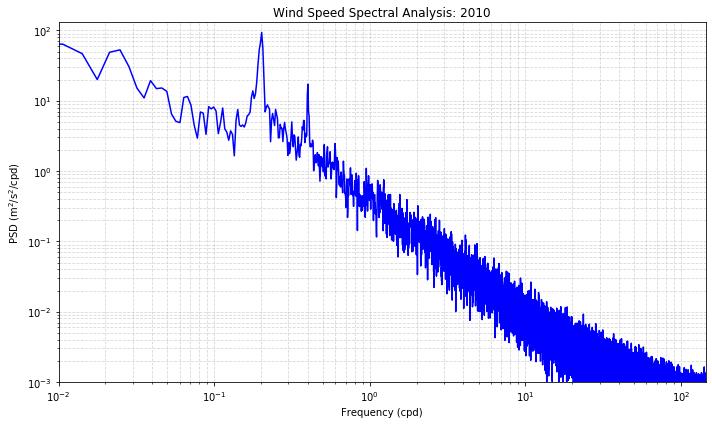

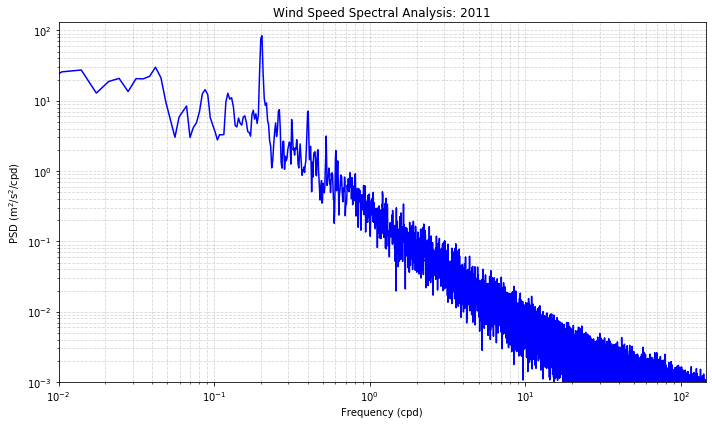

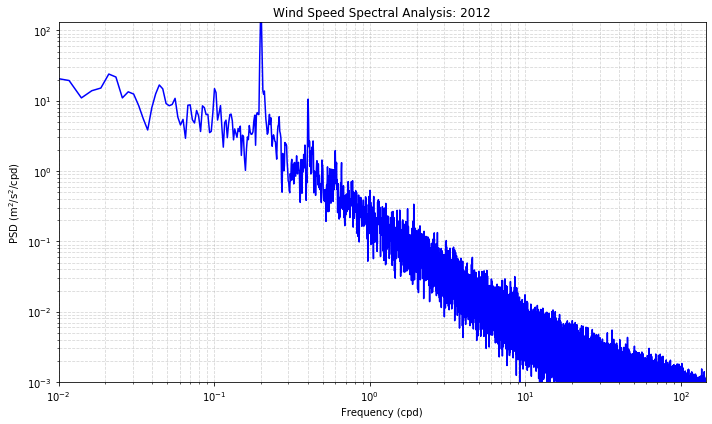

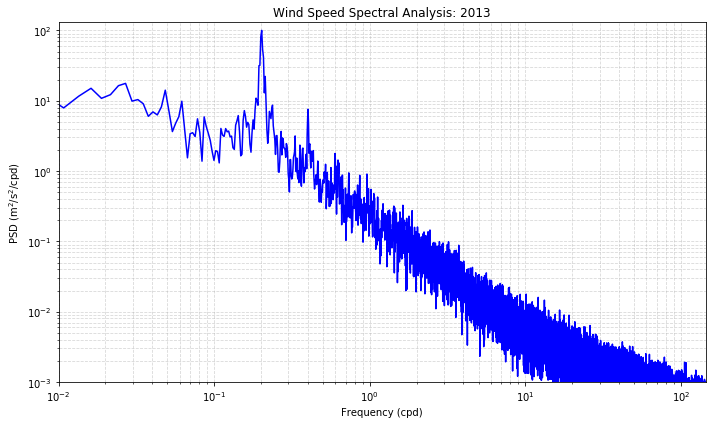

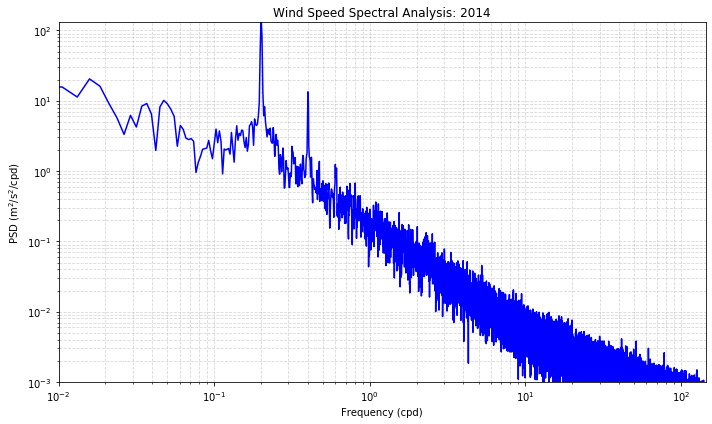

...

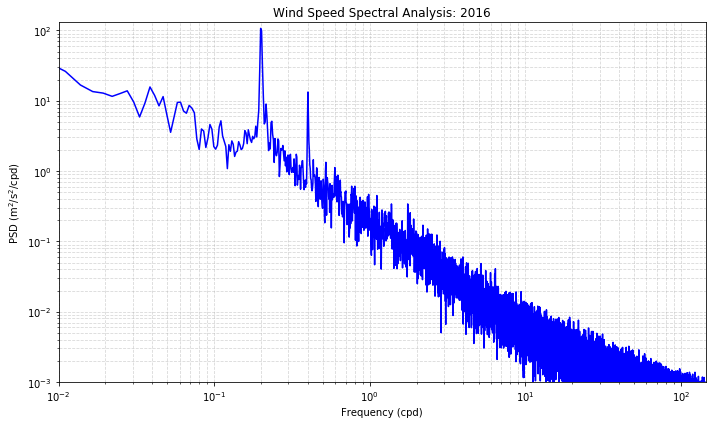

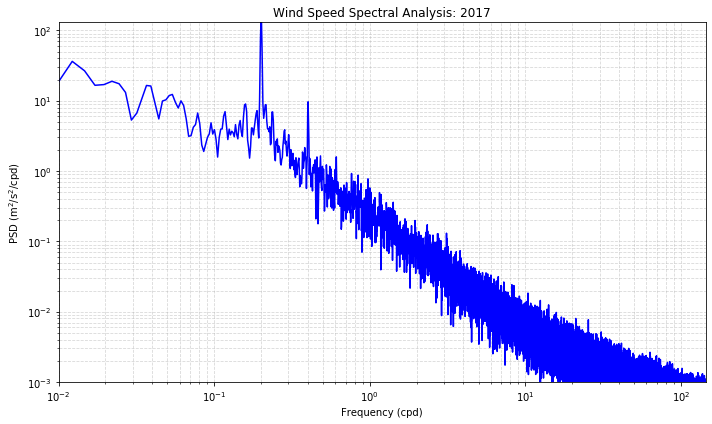

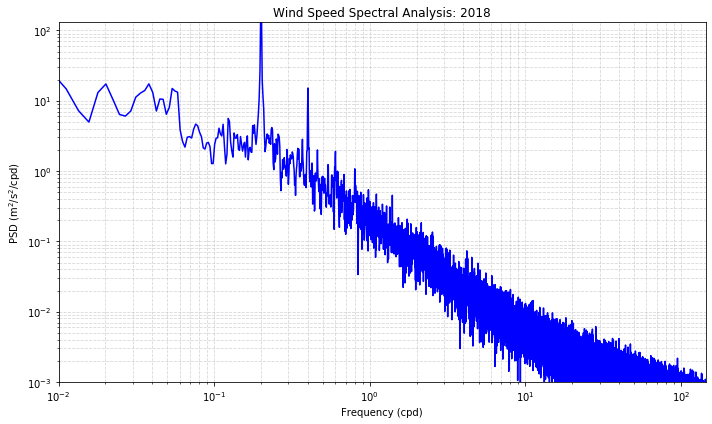

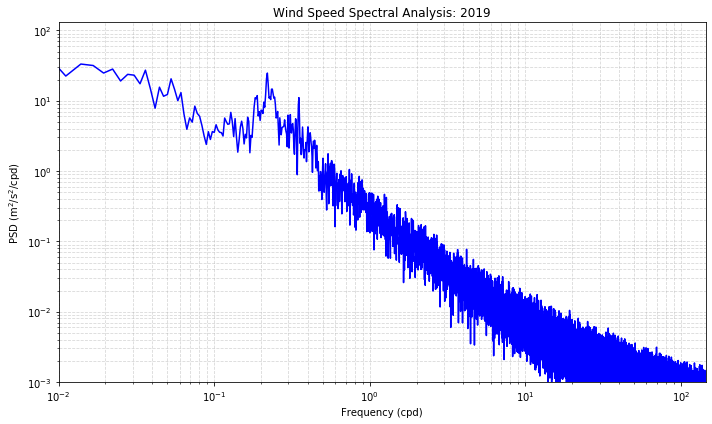

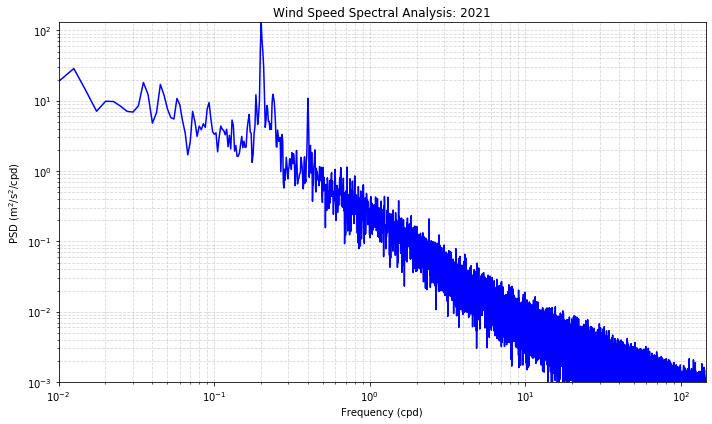

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import welch

# Unpack the lists into individual variables
time_list = [time10, time11, time12, time13, time14, time15, time16, time17, time18, time19, time21]
wind_spd_list = [wind_spd10, wind_spd11, wind_spd12, wind_spd13, wind_spd14, wind_spd15, wind_spd16, wind_spd17, wind_spd18, wind_spd19, wind_spd21]

# Define local dataset files for wind
local_datasets = {
    2010: 'wind_2010.nc',
    2011: 'wind_2011.nc',
    2012: 'wind_2012.nc',
    2013: 'wind_2013.nc',
    2014: 'wind_2014.nc',
    2015: 'wind_2015.nc',
    2016: 'wind_2016.nc',
    2017: 'wind_2017.nc',
    2018: 'wind_2018.nc',
    2019: 'wind_2019.nc',
    2021: 'wind_2021.nc'
}

# Read and process wind datasets
for year, dataset_file in zip(range(2010, 2022), local_datasets.values()):
    wind_spd = wind_spd_list[year - 2010]  # Select wind speed for the current year

    # Welch's method for spectral analysis
    N = len(wind_spd)
    winlen = N / 4
    fs = 288
    fN = 0.5 * fs
    f, S = welch(wind_spd, fs=fs, nperseg=winlen, window='hanning', detrend='linear')
    
    # Plotting
    plt.figure(figsize=(10, 6))
    plt.loglog(f, S, color='blue')  # color :) 
    plt.title(f'Wind Speed Spectral Analysis: {year if year != 2020 else 2021}')
    plt.xlabel('Frequency (cpd)')
    plt.ylabel('PSD (m$^{2}$/s$^{2}$/cpd)')  # Adjusted unit for wind speed
    plt.ylim(0.001, 130)  # Adjust y-axis 
    plt.xlim(0.01, fN)
    plt.grid(True, which="both", ls="--", alpha=0.5)
    plt.tight_layout()
    plt.show()


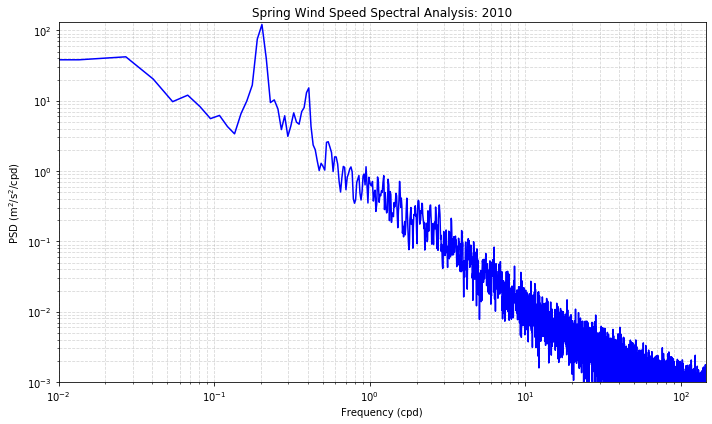

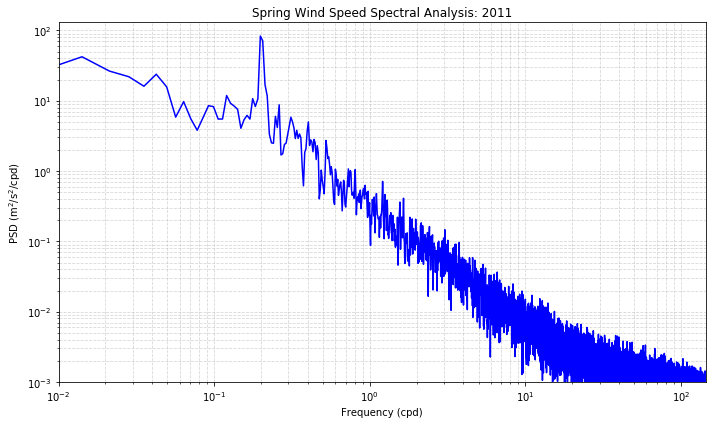

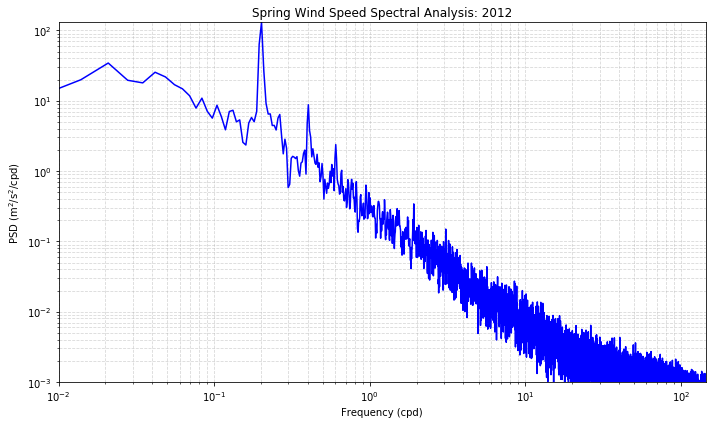

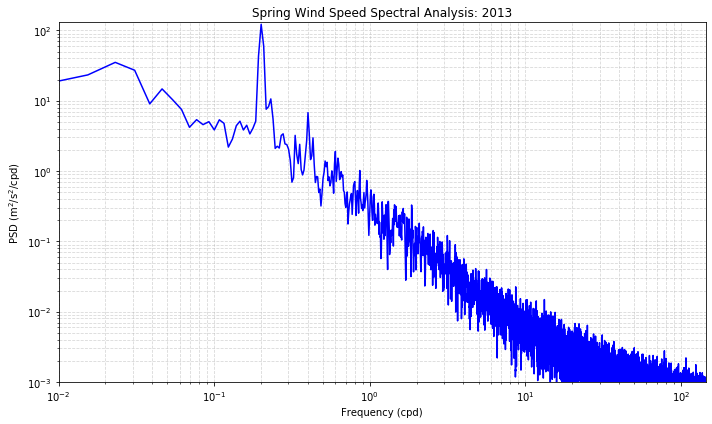

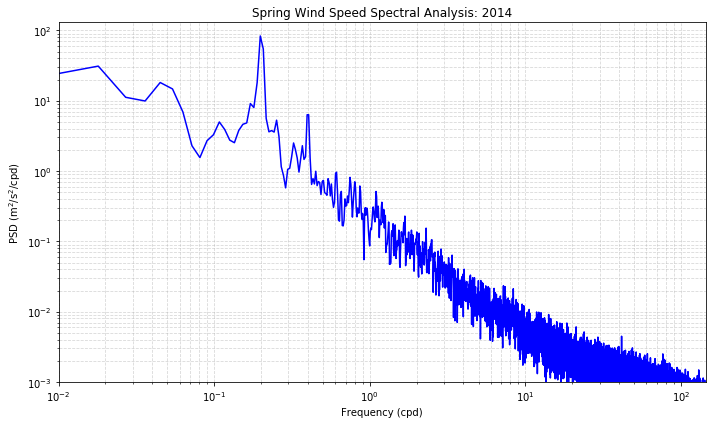

...

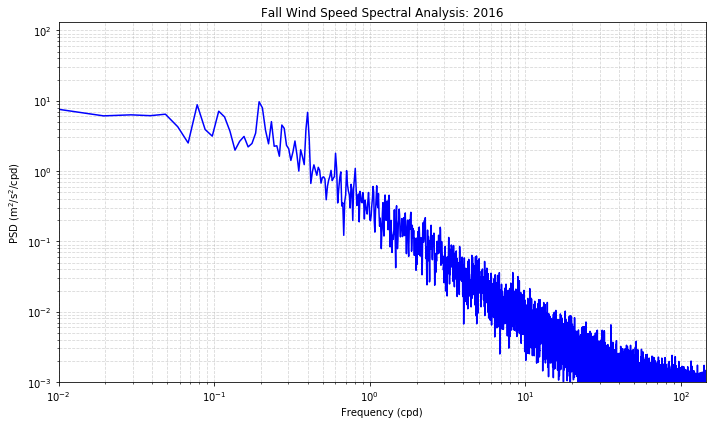

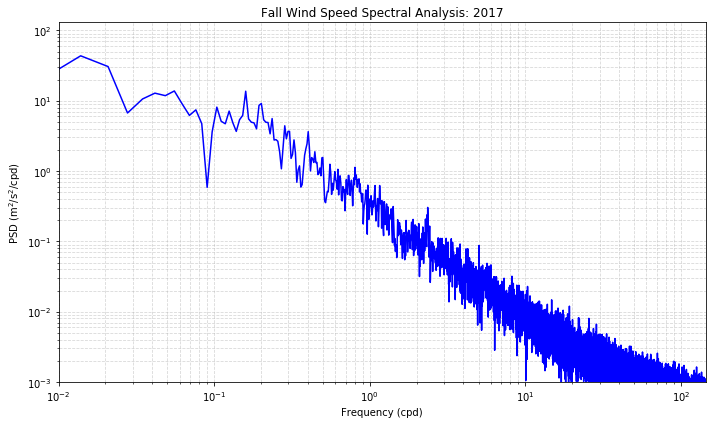

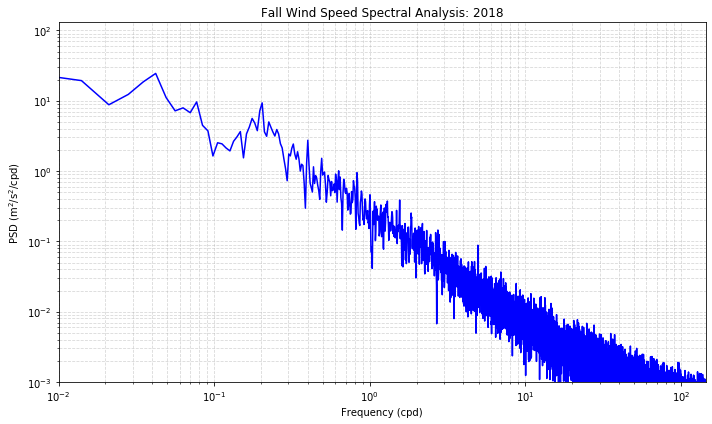

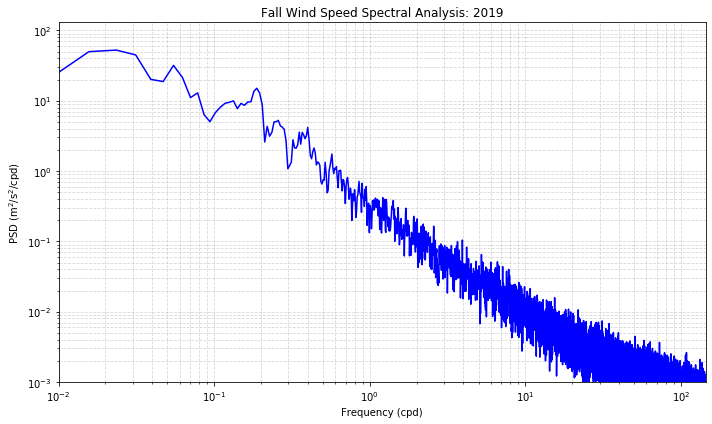

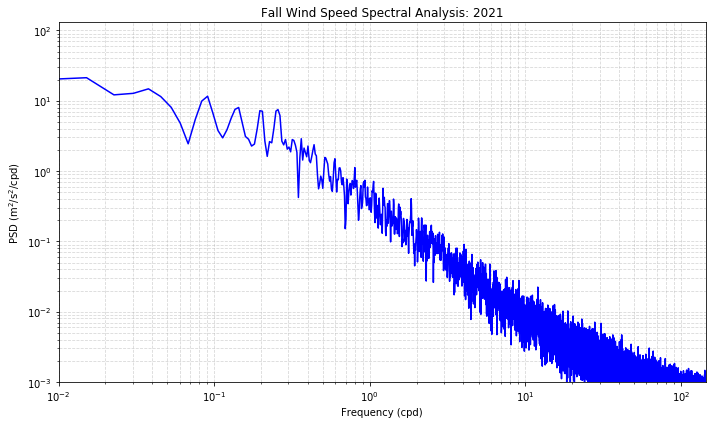

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import welch

# Define the variables provided
time_list = [time10, time11, time12, time13, time14, time15, time16, time17, time18, time19, time21]
wind_spd_list = [wind_spd10, wind_spd11, wind_spd12, wind_spd13, wind_spd14, wind_spd15, wind_spd16, wind_spd17, wind_spd18, wind_spd19, wind_spd21]
wind_dir_list = [wind_dir10, wind_dir11, wind_dir12, wind_dir13, wind_dir14, wind_dir15, wind_dir16, wind_dir17, wind_dir18, wind_dir19, wind_dir21]

# Define the seasons
spring_months = [3, 4, 5, 6]
summer_months = [7, 8, 9, 10]
fall_months = [11, 12, 1, 2]  # November, December, January, February

# Define a function to create subsets for each season
def subset_data(df, start_month, end_month):
    if start_month <= end_month:
        return df[(df['month'] >= start_month) & (df['month'] <= end_month)]
    else:
        return pd.concat([df[df['month'] >= start_month], df[df['month'] <= end_month]])

# Initialize dictionaries to store subsets for each season
spring_subsets = {}
summer_subsets = {}
fall_subsets = {}

# Create subsets for each year and season
for year, time, wind_spd, wind_dir in zip(range(2010, 2022), time_list, wind_spd_list, wind_dir_list):
    # Convert time to datetime
    df = pd.DataFrame({'time': time, 'wind_spd': wind_spd, 'wind_dir': wind_dir})
    df['month'] = df['time'].dt.month
    
    # Create subsets for each season
    spring_subsets[year] = subset_data(df, spring_months[0], spring_months[-1])
    summer_subsets[year] = subset_data(df, summer_months[0], summer_months[-1])
    fall_subsets[year] = subset_data(df, fall_months[0], fall_months[-1])

# Plotting for each season
for season, subsets in zip(["Spring", "Summer", "Fall"], [spring_subsets, summer_subsets, fall_subsets]):
    for year, df in subsets.items():
        wind_spd = df['wind_spd']
        # Welch's method for spectral analysis
        N = len(wind_spd)
        winlen = N / 4
        fs = 288
        fN = 0.5 * fs
        f, S = welch(wind_spd, fs=fs, nperseg=winlen, window='hanning', detrend='linear')
        
        # Plotting
        plt.figure(figsize=(10, 6))
        plt.loglog(f, S, color='blue')  # color :) 
        # Adjusted the title to display 2021 instead of 2020
        plt.title(f'{season} Wind Speed Spectral Analysis: {year if year != 2020 else 2021}')
        plt.xlabel('Frequency (cpd)')
        plt.ylabel('PSD (m$^{2}$/s$^{2}$/cpd)')  # Adjusted unit for wind speed
        plt.ylim(0.001, 130)  # Adjust y-axis 
        plt.xlim(0.01, fN)
        plt.grid(True, which="both", ls="--", alpha=0.5)
        plt.tight_layout()
        plt.show()


/Users/marisolfigueroa/opt/miniconda3/lib/python3.7/site-packages/scipy/signal/spectral.py:1966: UserWarning: nperseg = 43191 is greater than input length  = 30762, using nperseg = 30762
  .format(nperseg, input_length))


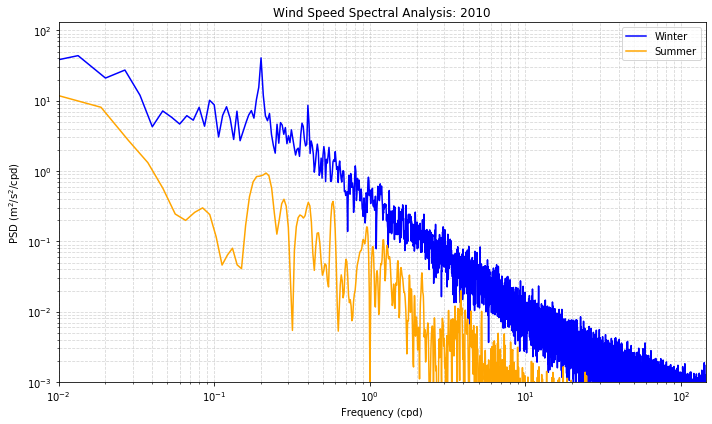

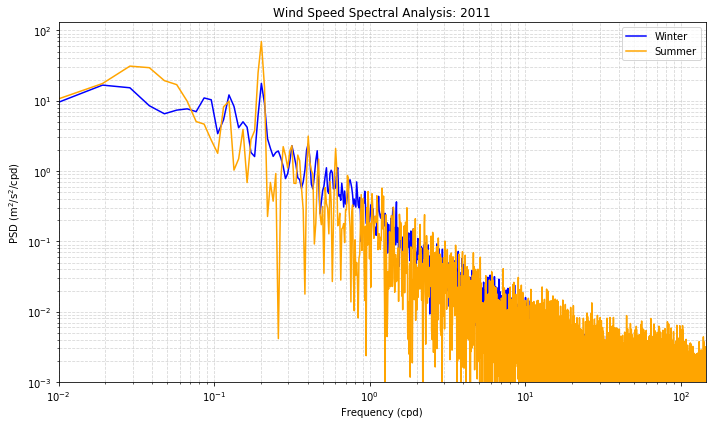

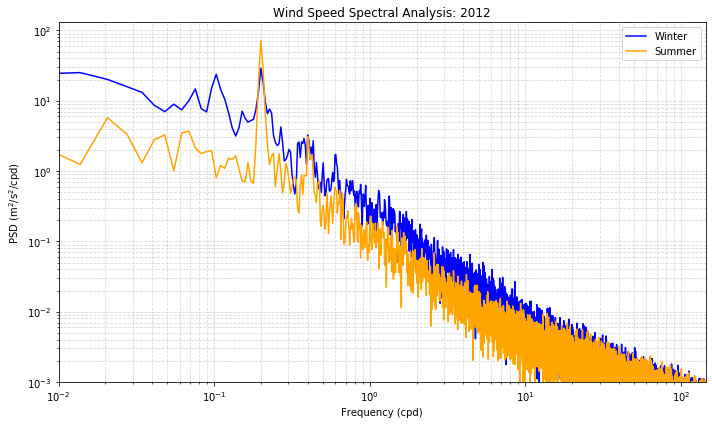

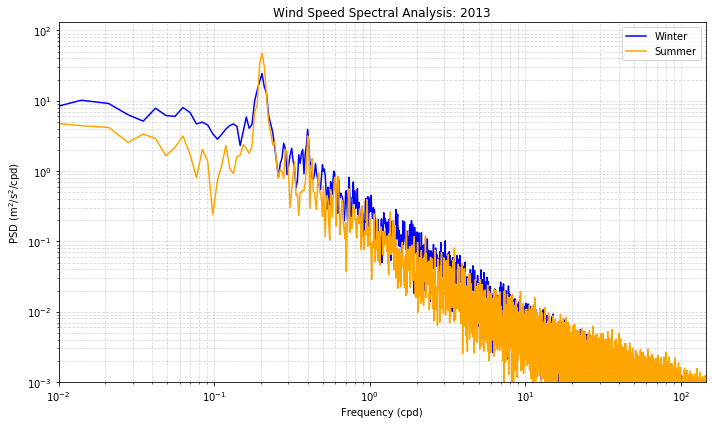

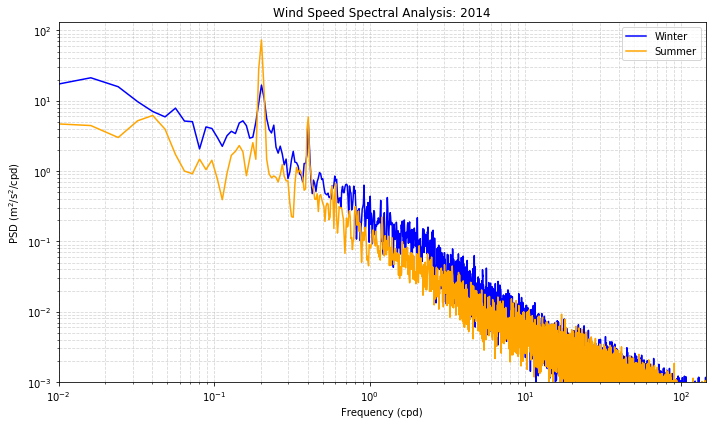

...

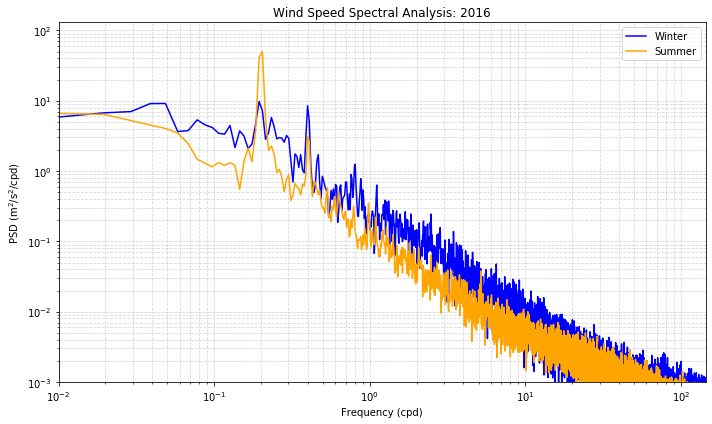

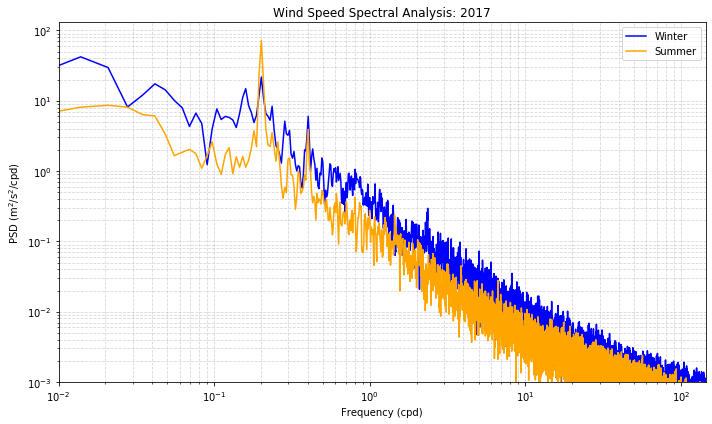

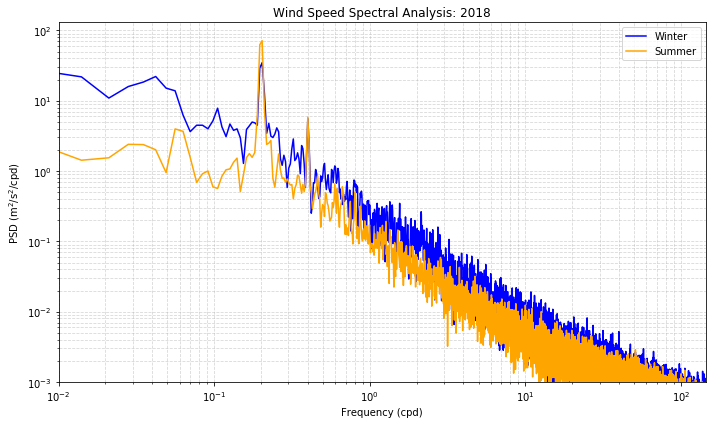

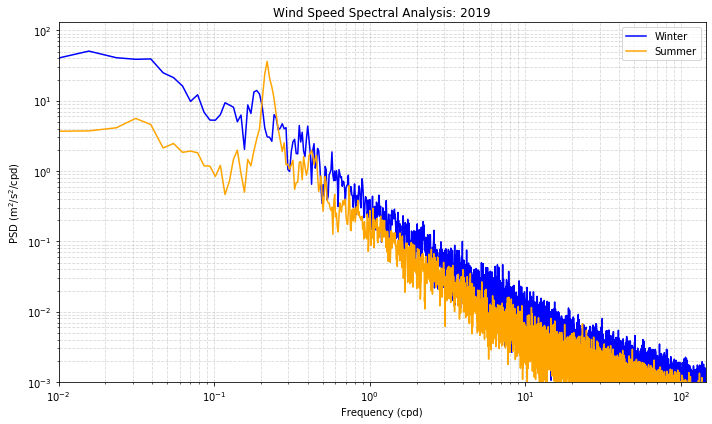

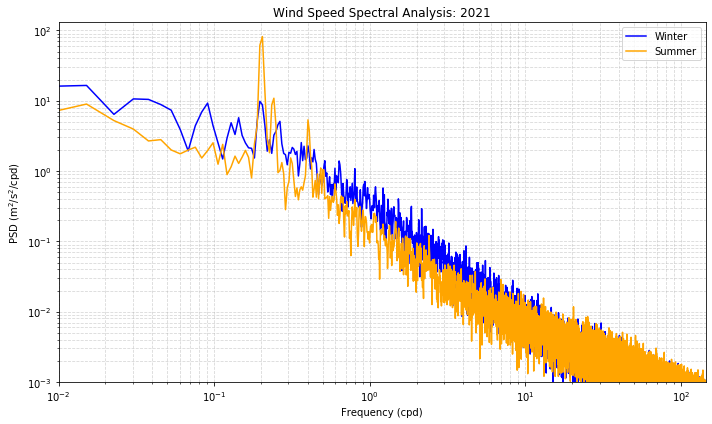

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import welch

# Define the variables provided
time_list = [time10, time11, time12, time13, time14, time15, time16, time17, time18, time19, time21]
wind_spd_list = [wind_spd10, wind_spd11, wind_spd12, wind_spd13, wind_spd14, wind_spd15, wind_spd16, wind_spd17, wind_spd18, wind_spd19, wind_spd21]
wind_dir_list = [wind_dir10, wind_dir11, wind_dir12, wind_dir13, wind_dir14, wind_dir15, wind_dir16, wind_dir17, wind_dir18, wind_dir19, wind_dir21]

# Define the seasons
winter_months = [11, 12, 1, 2]  # November, December, January, February
summer_months = [6, 7, 8, 9]  # June, July, August, September

# Initialize dictionaries to store subsets for each season
winter_subsets = {}
summer_subsets = {}

# Create subsets for each year and season
for year, time, wind_spd, wind_dir in zip(range(2010, 2022), time_list, wind_spd_list, wind_dir_list):
    # Convert time to datetime
    df = pd.DataFrame({'time': time, 'wind_spd': wind_spd, 'wind_dir': wind_dir})
    df['month'] = df['time'].dt.month
    
    # Create subsets for each season
    if year == 2021:
        winter_subsets[year] = df[(df['month'].isin(winter_months)) & (df['month'] != 12)]
    else:
        winter_subsets[year] = df[df['month'].isin(winter_months)]
    summer_subsets[year] = df[df['month'].isin(summer_months)]

# Plotting for each year
for year in range(2010, 2022):
    # Get winter and summer subsets for the year
    winter_df = winter_subsets.get(year, pd.DataFrame())  # Handle case where data for the year is missing
    summer_df = summer_subsets.get(year, pd.DataFrame())  # Handle case where data for the year is missing
    
    # Proceed with plotting only if there are data for both winter and summer
    if not winter_df.empty and not summer_df.empty:
        # Welch's method for spectral analysis
        N = len(winter_df)
        winlen = N / 4
        fs = 288
        fN = 0.5 * fs

        # Calculate power spectral density for winter wind speed
        f_winter, S_winter = welch(winter_df['wind_spd'], fs=fs, nperseg=winlen, window='hanning', detrend='linear')

        # Calculate power spectral density for summer wind speed
        f_summer, S_summer = welch(summer_df['wind_spd'], fs=fs, nperseg=winlen, window='hanning', detrend='linear')

        # Plotting
        plt.figure(figsize=(10, 6))
        plt.loglog(f_winter, S_winter, label='Winter', color='blue')
        plt.loglog(f_summer, S_summer, label='Summer', color='orange')
        plt.title(f'Wind Speed Spectral Analysis: {year if year != 2020 else 2021}')  # Corrected title for 2021
        plt.xlabel('Frequency (cpd)')
        plt.ylabel('PSD (m$^{2}$/s$^{2}$/cpd)')
        plt.ylim(0.001, 130)
        plt.xlim(0.01, fN)
        plt.grid(True, which="both", ls="--", alpha=0.5)
        plt.legend()
        plt.tight_layout()
        plt.show()


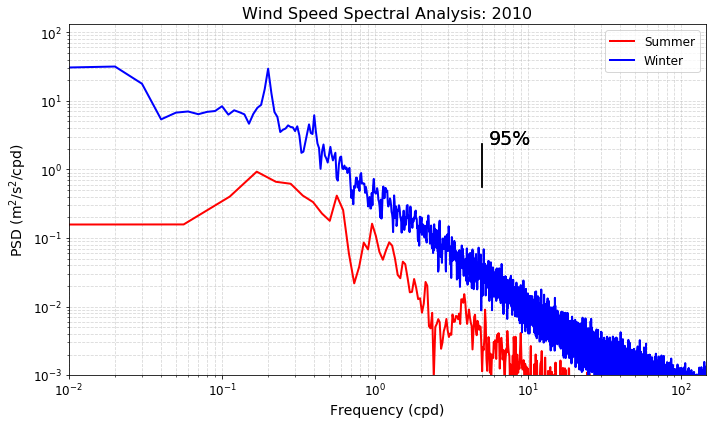

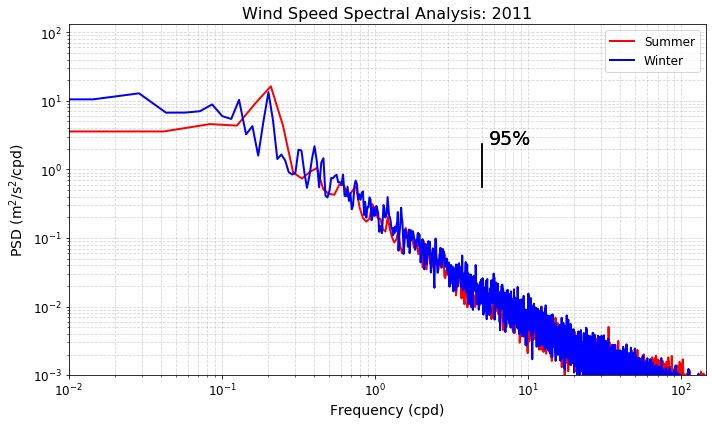

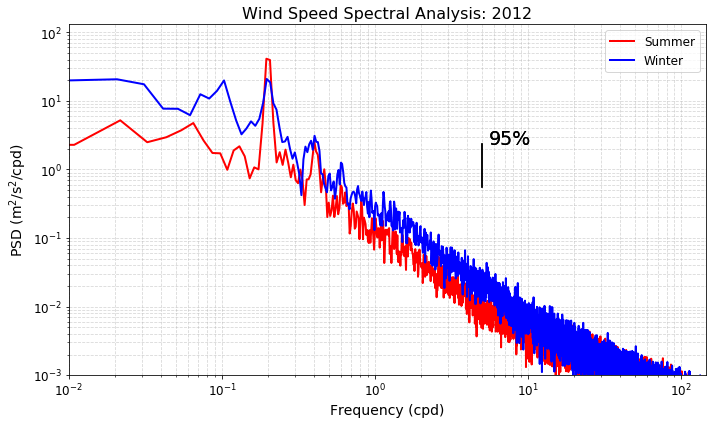

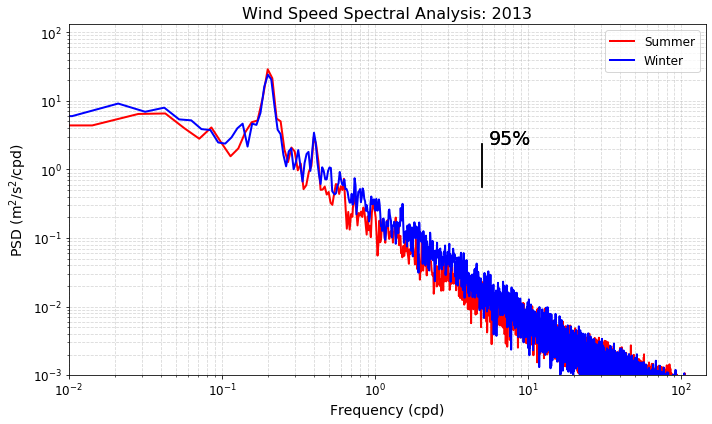

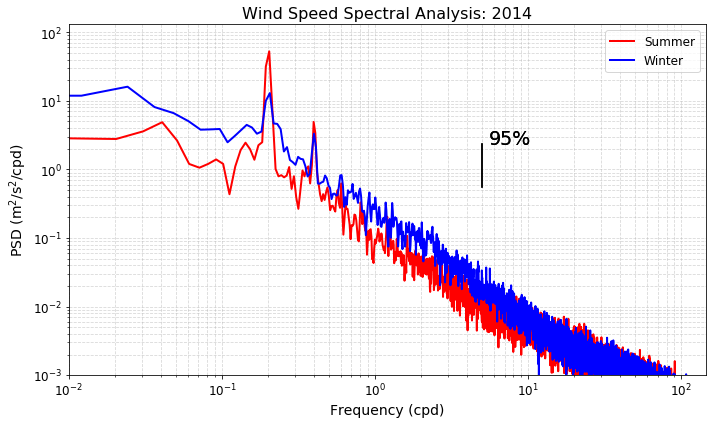

...

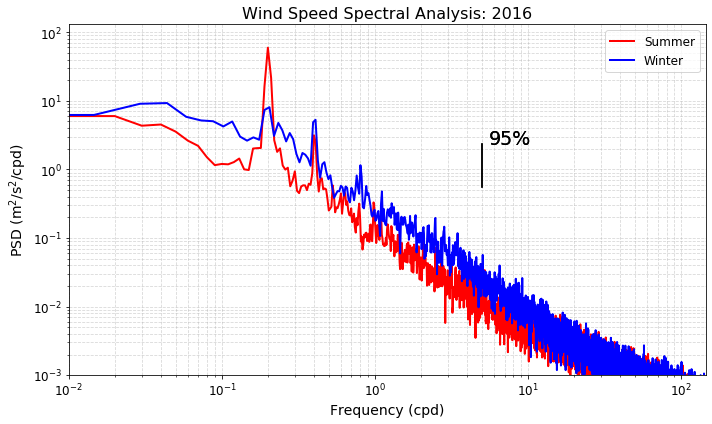

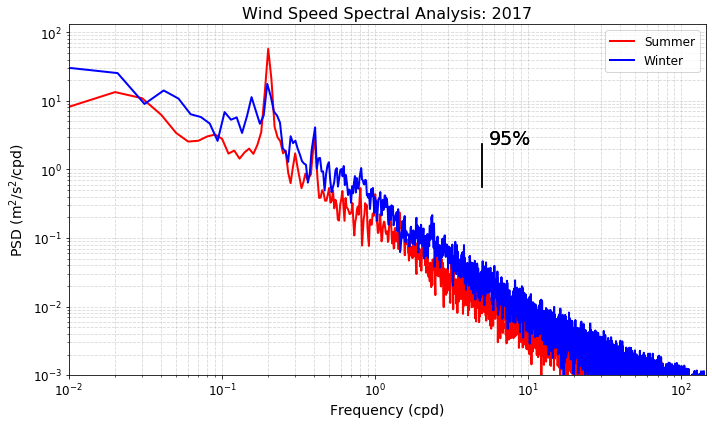

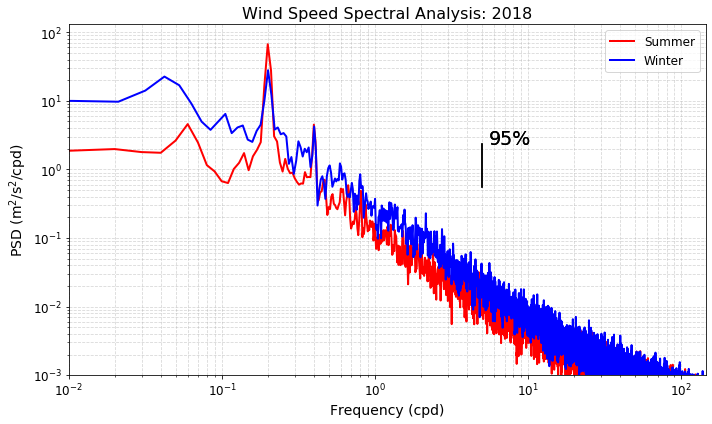

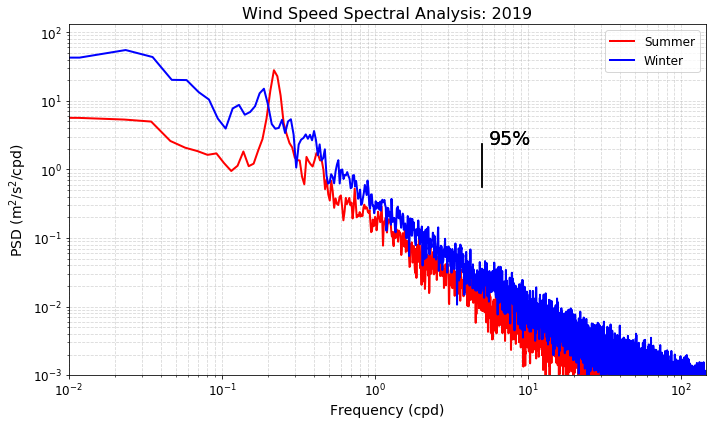

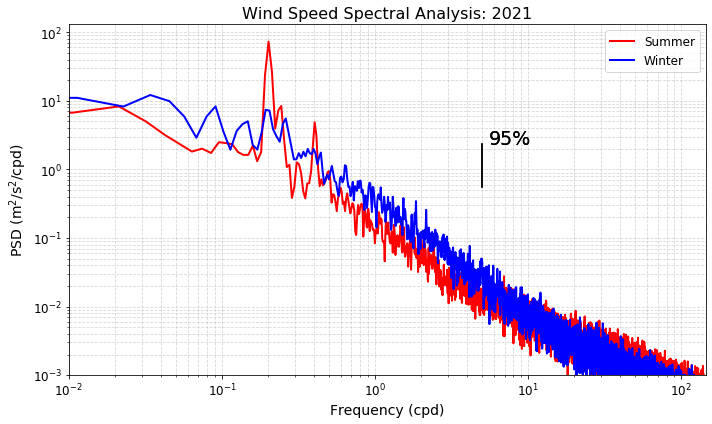

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import welch
from scipy.stats import chi2

# Define the variables provided
time_list = [time10, time11, time12, time13, time14, time15, time16, time17, time18, time19, time21]
wind_spd_list = [wind_spd10, wind_spd11, wind_spd12, wind_spd13, wind_spd14, wind_spd15, wind_spd16, wind_spd17, wind_spd18, wind_spd19, wind_spd21]
wind_dir_list = [wind_dir10, wind_dir11, wind_dir12, wind_dir13, wind_dir14, wind_dir15, wind_dir16, wind_dir17, wind_dir18, wind_dir19, wind_dir21]

# Define the seasons
winter_months = [11, 12, 1, 2]  # November, December, January, February
summer_months = [6, 7, 8, 9]  # June, July, August, September

# Initialize dictionaries to store subsets for each season
winter_subsets = {}
summer_subsets = {}

# Create subsets for each year and season
for year, time, wind_spd, wind_dir in zip(range(2010, 2022), time_list, wind_spd_list, wind_dir_list):
    # Convert time to datetime
    df = pd.DataFrame({'time': time, 'wind_spd': wind_spd, 'wind_dir': wind_dir})
    df['month'] = df['time'].dt.month
    
    # Create subsets for each season
    if year == 2021:
        winter_subsets[year] = df[(df['month'].isin(winter_months)) & (df['month'] != 12)]
    else:
        winter_subsets[year] = df[df['month'].isin(winter_months)]
    summer_subsets[year] = df[df['month'].isin(summer_months)]

# Plotting for each year
for year in range(2010, 2022):
    # Get winter and summer subsets for the year
    winter_df = winter_subsets.get(year, pd.DataFrame())  # Handle case where data for the year is missing
    summer_df = summer_subsets.get(year, pd.DataFrame())  # Handle case where data for the year is missing
    
    # plotting only if there are data for both winter and summer. Love this command. 
    if not winter_df.empty and not summer_df.empty:
        # Welch's method for spectral analysis
        N_winter = len(winter_df)
        winlen_winter = N_winter / 6
        fs = 288
        fN = 0.5 * fs

        N_summer = len(summer_df)
        winlen_summer = N_summer / 6

        # Calculate power spectral density for winter wind speed
        f_winter, S_winter = welch(winter_df['wind_spd'], fs=fs, nperseg=winlen_winter, window='hanning', detrend='linear')

        # Calculate power spectral density for summer wind speed
        f_summer, S_summer = welch(summer_df['wind_spd'], fs=fs, nperseg=winlen_summer, window='hanning', detrend='linear')
        
        # Calculate confidence intervals for summer
        edof_summer = (8/3) * (N_summer / winlen_summer)  # Effective degrees of freedom
        lower_summer = edof_summer / chi2.ppf(0.975, edof_summer)
        upper_summer = edof_summer / chi2.ppf(0.025, edof_summer)
        
        # Calculate confidence intervals for winter
        edof_winter = (8/3) * (N_winter / winlen_winter)  # Effective degrees of freedom
        lower_winter = edof_winter / chi2.ppf(0.975, edof_winter)
        upper_winter = edof_winter / chi2.ppf(0.025, edof_winter)

        # Plot the results for summer and winter on the same plot
        plt.figure(figsize=(10, 6))  # Larger figure size
        plt.loglog(f_summer, S_summer, color='red', label='Summer', linewidth=2)  # Red line for summer with increased linewidth
        plt.loglog(f_winter, S_winter, color='blue', label='Winter', linewidth=2)  # Blue line for winter with increased linewidth

        # Plot confidence intervals for summer and winter
        plt.plot([5, 5], np.array([lower_summer, upper_summer]), '-k')  # Black error bar line for summer
        plt.plot([5, 5], np.array([lower_winter, upper_winter]), '-k')  # Black error bar line for winter

        # Add the '95%' text next to the error bar line
        plt.text(5.5, upper_summer, '95%', fontsize=19, color='black')
        plt.text(5.5, upper_winter, '95%', fontsize=19, color='black')

        plt.title(f'Wind Speed Spectral Analysis: {year if year != 2020 else 2021}', fontsize=16)  # Larger title font size
        plt.xlabel('Frequency (cpd)', fontsize=14)  # Larger x-axis label font size
        plt.ylabel('PSD (m$^{2}$/s$^{2}$/cpd)', fontsize=14)  # Larger y-axis label font size
        plt.xticks(fontsize=12)  # Larger x-axis tick font size
        plt.yticks(fontsize=12)  # Larger y-axis tick font size
        plt.ylim(0.001, 130)
        plt.xlim(0.01, fN)
        plt.grid(True, which="both", ls="--", alpha=0.5)
        plt.legend(fontsize=12)  # Larger legend font size
        plt.tight_layout()
        plt.show()

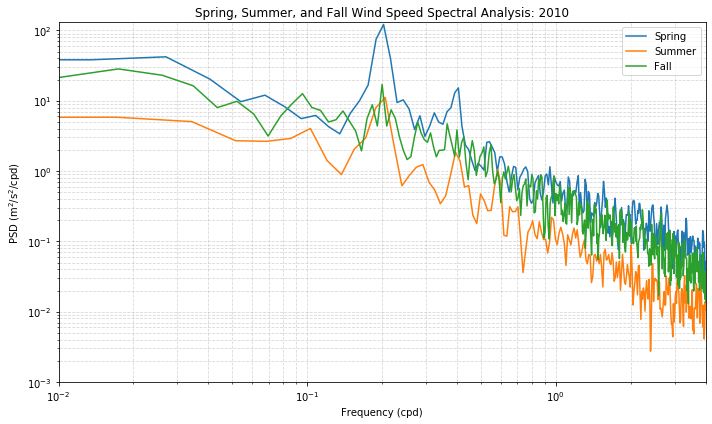

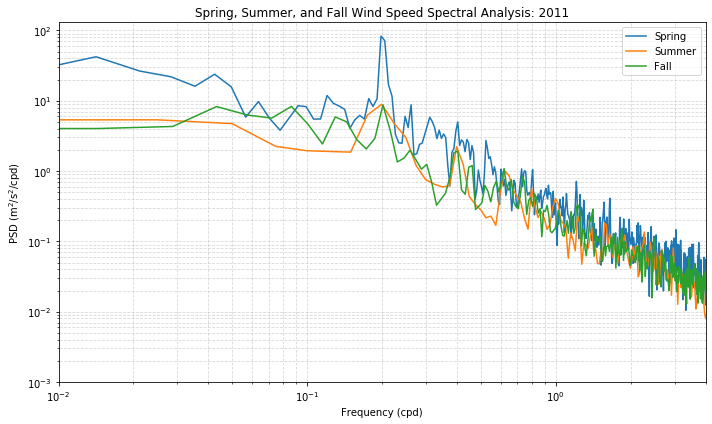

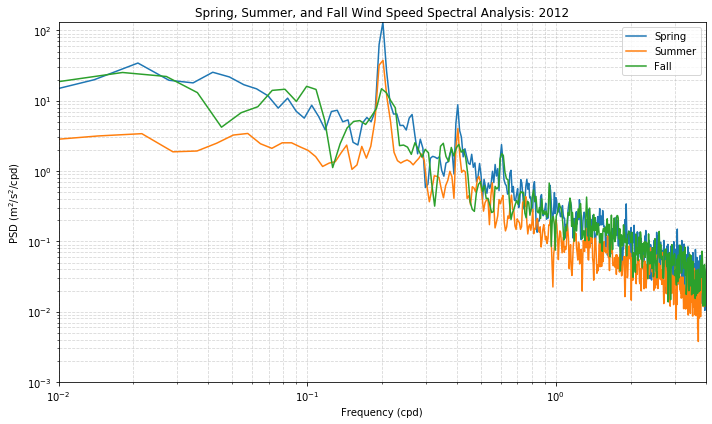

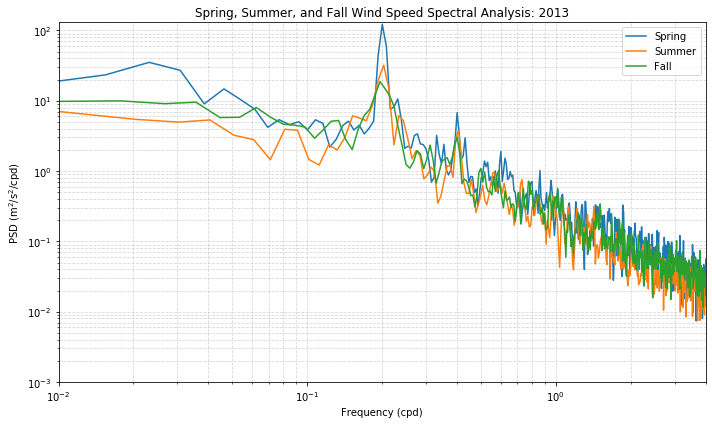

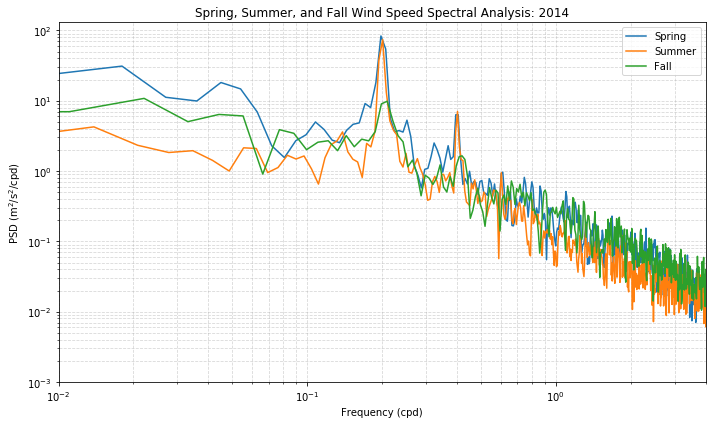

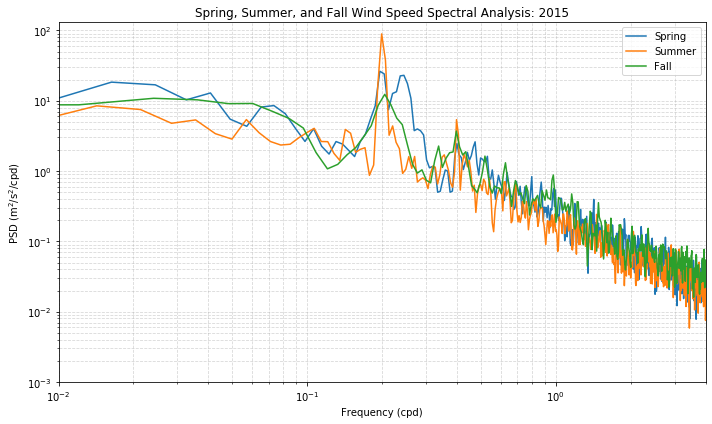

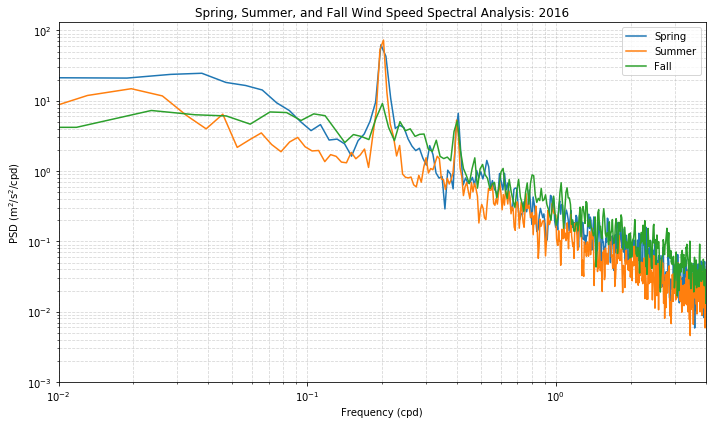

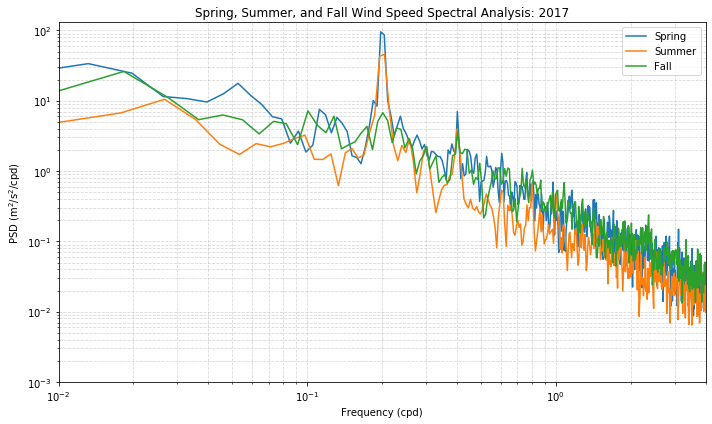

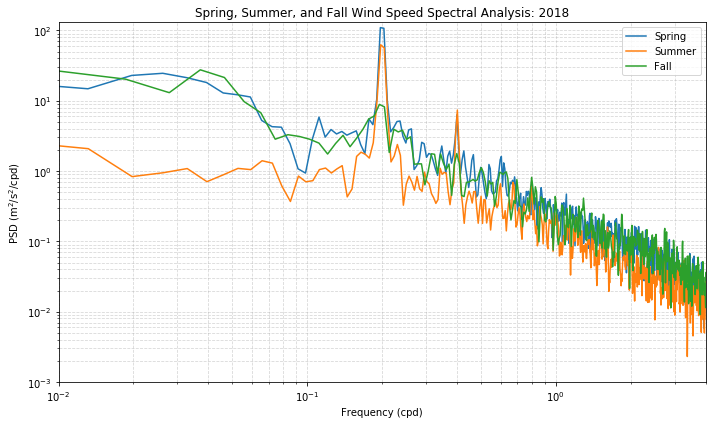

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import welch

# Define the variables provided
time_list = [time10, time11, time12, time13, time14, time15, time16, time17, time18, time19, time21]
wind_spd_list = [wind_spd10, wind_spd11, wind_spd12, wind_spd13, wind_spd14, wind_spd15, wind_spd16, wind_spd17, wind_spd18, wind_spd19, wind_spd21]
wind_dir_list = [wind_dir10, wind_dir11, wind_dir12, wind_dir13, wind_dir14, wind_dir15, wind_dir16, wind_dir17, wind_dir18, wind_dir19, wind_dir21]

# Define the seasons
spring_months = [3, 4, 5, 6]
summer_months = [7, 8, 9, 10]
fall_months = [11, 12, 1, 2]  # November, December, January, February

# Initialize dictionaries to store subsets for each season
spring_subsets = {}
summer_subsets = {}
fall_subsets = {}

# Create subsets for each year and season
for year, time, wind_spd, wind_dir in zip(range(2010, 2019), time_list[:9], wind_spd_list[:9], wind_dir_list[:9]):
    # Convert time to datetime
    df = pd.DataFrame({'time': time, 'wind_spd': wind_spd, 'wind_dir': wind_dir})
    df['month'] = df['time'].dt.month
    
    # Create subsets for each season
    spring_subsets[year] = df[df['month'].isin(spring_months)]
    summer_subsets[year] = df[df['month'].isin(summer_months)]
    fall_subsets[year] = df[df['month'].isin(fall_months[:-1])]

# Plotting for each year
for year in range(2010, 2019):
    plt.figure(figsize=(10, 6))
    plt.title(f'Spring, Summer, and Fall Wind Speed Spectral Analysis: {year}')
    plt.xlabel('Frequency (cpd)')
    plt.ylabel('PSD (m$^{2}$/s$^{2}$/cpd)')
    plt.ylim(0.001, 130)
    plt.xlim(0.01, 4)  # Assuming a maximum frequency of 4 cpd
    
    for season, subsets in zip(["Spring", "Summer", "Fall"], [spring_subsets, summer_subsets, fall_subsets]):
        wind_spd = subsets.get(year, pd.DataFrame())['wind_spd']
        if not wind_spd.empty:
            # Welch's method for spectral analysis
            N = len(wind_spd)
            winlen = N / 4
            fs = 288
            fN = 0.5 * fs
            f, S = welch(wind_spd, fs=fs, nperseg=winlen, window='hanning', detrend='linear')
            
            # Plotting
            plt.loglog(f, S, label=season)
    
    plt.grid(True, which="both", ls="--", alpha=0.5)
    plt.legend()
    plt.tight_layout()
    plt.show()


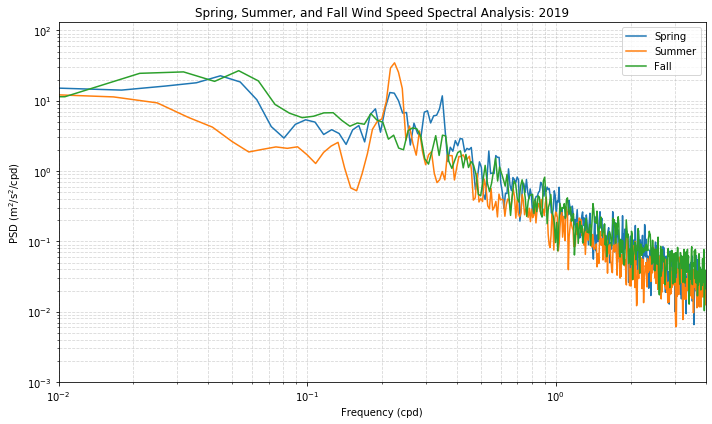

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import welch

# Define the variables provided
time_list = [time10, time11, time12, time13, time14, time15, time16, time17, time18, time19, time21]
wind_spd_list = [wind_spd10, wind_spd11, wind_spd12, wind_spd13, wind_spd14, wind_spd15, wind_spd16, wind_spd17, wind_spd18, wind_spd19, wind_spd21]
wind_dir_list = [wind_dir10, wind_dir11, wind_dir12, wind_dir13, wind_dir14, wind_dir15, wind_dir16, wind_dir17, wind_dir18, wind_dir19, wind_dir21]

# Define the seasons
spring_months = [3, 4, 5, 6]
summer_months = [7, 8, 9, 10]
fall_months = [11, 12, 1, 2]  # November, December, January, February

# Initialize dictionaries to store subsets for each season
spring_subsets = {}
summer_subsets = {}
fall_subsets = {}

# Create subsets for 2019 only
year = 2019
time = time_list[-2]
wind_spd = wind_spd_list[-2]
wind_dir = wind_dir_list[-2]

# Convert time to datetime
df = pd.DataFrame({'time': time, 'wind_spd': wind_spd, 'wind_dir': wind_dir})
df['month'] = df['time'].dt.month

# Create subsets for each season in 2019
spring_subsets[year] = df[df['month'].isin(spring_months)]
summer_subsets[year] = df[df['month'].isin(summer_months)]
fall_subsets[year] = df[df['month'].isin(fall_months[:-1])]

# Plotting for 2019
plt.figure(figsize=(10, 6))
plt.title('Spring, Summer, and Fall Wind Speed Spectral Analysis: 2019')
plt.xlabel('Frequency (cpd)')
plt.ylabel('PSD (m$^{2}$/s$^{2}$/cpd)')
plt.ylim(0.001, 130)
plt.xlim(0.01, 4)  # Assuming a maximum frequency of 4 cpd

for season, subsets in zip(["Spring", "Summer", "Fall"], [spring_subsets, summer_subsets, fall_subsets]):
    wind_spd = subsets.get(year, pd.DataFrame())['wind_spd']
    if not wind_spd.empty:
        # Welch's method for spectral analysis
        N = len(wind_spd)
        winlen = N / 4
        fs = 288
        fN = 0.5 * fs
        f, S = welch(wind_spd, fs=fs, nperseg=winlen, window='hanning', detrend='linear')
        
        # Plotting
        plt.loglog(f, S, label=season)

plt.grid(True, which="both", ls="--", alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()


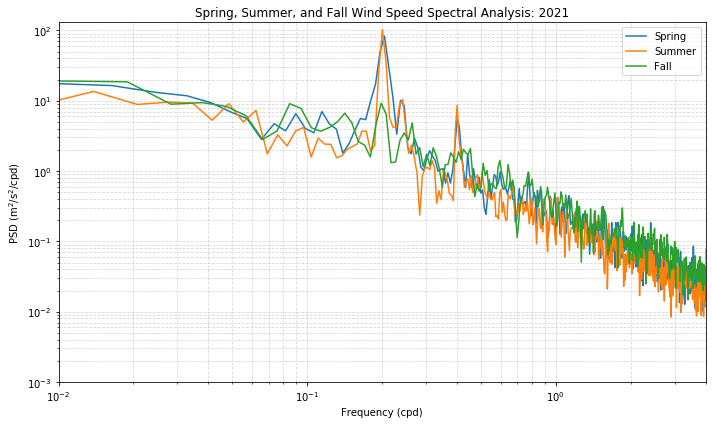

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import welch

# Define the variables provided
time_list = [time10, time11, time12, time13, time14, time15, time16, time17, time18, time19, time21]
wind_spd_list = [wind_spd10, wind_spd11, wind_spd12, wind_spd13, wind_spd14, wind_spd15, wind_spd16, wind_spd17, wind_spd18, wind_spd19, wind_spd21]
wind_dir_list = [wind_dir10, wind_dir11, wind_dir12, wind_dir13, wind_dir14, wind_dir15, wind_dir16, wind_dir17, wind_dir18, wind_dir19, wind_dir21]

# Define the seasons
spring_months = [3, 4, 5, 6]
summer_months = [7, 8, 9, 10]
fall_months = [11, 12, 1, 2]  # November, December, January, February

# Initialize dictionaries to store subsets for each season
spring_subsets = {}
summer_subsets = {}
fall_subsets = {}

# Create subsets for 2021 only
year = 2021
time = time_list[-1]
wind_spd = wind_spd_list[-1]
wind_dir = wind_dir_list[-1]

# Convert time to datetime
df = pd.DataFrame({'time': time, 'wind_spd': wind_spd, 'wind_dir': wind_dir})
df['month'] = df['time'].dt.month

# Create subsets for each season in 2021
spring_subsets[year] = df[df['month'].isin(spring_months)]
summer_subsets[year] = df[df['month'].isin(summer_months)]
fall_subsets[year] = df[(df['month'].isin(fall_months[:-1])) | (df['month'] == 12)]  # Include December for winter

# Plotting for 2021
plt.figure(figsize=(10, 6))
plt.title('Spring, Summer, and Fall Wind Speed Spectral Analysis: 2021')
plt.xlabel('Frequency (cpd)')
plt.ylabel('PSD (m$^{2}$/s$^{2}$/cpd)')
plt.ylim(0.001, 130)
plt.xlim(0.01, 4)  # Assuming a maximum frequency of 4 cpd

for season, subsets in zip(["Spring", "Summer", "Fall"], [spring_subsets, summer_subsets, fall_subsets]):
    wind_spd = subsets.get(year, pd.DataFrame())['wind_spd']
    if not wind_spd.empty:
        # Welch's method for spectral analysis
        N = len(wind_spd)
        winlen = N / 4
        fs = 288
        fN = 0.5 * fs
        f, S = welch(wind_spd, fs=fs, nperseg=winlen, window='hanning', detrend='linear')
        
        # Plotting
        plt.loglog(f, S, label=season)

plt.grid(True, which="both", ls="--", alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()
